In [1]:
from torch.utils.data import DataLoader

In [2]:
import os
import wandb
import numpy as np
from IPython.display import clear_output
import seaborn as sns
from torchdiffeq import odeint
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import matplotlib.pyplot as plt

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
print("GPU Name:", torch.cuda.get_device_name(0))

In [4]:
wandb.login()

True

In [5]:
wandb.init(project="NODE_rnn", group="NODE_rnn",save_code=True,notes="Neural ODE RNN runs and evaluation")

In [6]:
def visualize_3d(real=None, train=None, save=None, title=''):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    
    ax.set_title('Lorenz Attractor \n'+title)

    if train is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in train])
      z = np.reshape(z, [-1,3])
      sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Greens', s=1)
      cbar = fig.colorbar(sc)

    if real is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in real])
      z = np.reshape(z, [-1,3])
      sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Reds', s=1)
      cbar = fig.colorbar(sc)
      #ax.scatter(, marker='.', c=c,cmap='viridis', alpha=0.5, linewidths=0, s=45)

    fig.canvas.draw()
    fig.canvas.flush_events()
    if save is not None:
        plt.savefig(save+'.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
    plt.show()

In [7]:
def lorenz(t, X):
    sigma = 10.
    beta = 8/3
    rho = 28.
    if X.ndim == 1:
        x, y, z = X
    else:
        x, y, z = X.unbind(dim=-1)
    xdot = sigma * (y - x)
    ydot = x * (rho - z) - y
    zdot = x * y - beta * z
    return torch.stack([xdot, ydot, zdot], dim=-1)

In [8]:
num_conditions = 10
x_0 = torch.tensor([1., 0., 0.])
data = []

# Generate random initial conditions and integrate the Lorenz system
for _ in range(num_conditions):
    x_0 = torch.rand(3)  # Generate a random initial condition
    result = odeint(lorenz, x_0, t)
    data.append(result)

# Convert the list of data to a NumPy array
data = torch.stack(data, dim=0)
# Define the time values
t = torch.linspace(0., 1000., 1000)

# Using ODE Solver to Integrate the function to get the data
true_lorenz = odeint(lorenz, x_0, t)
visualize_3d(real=true_lorenz)

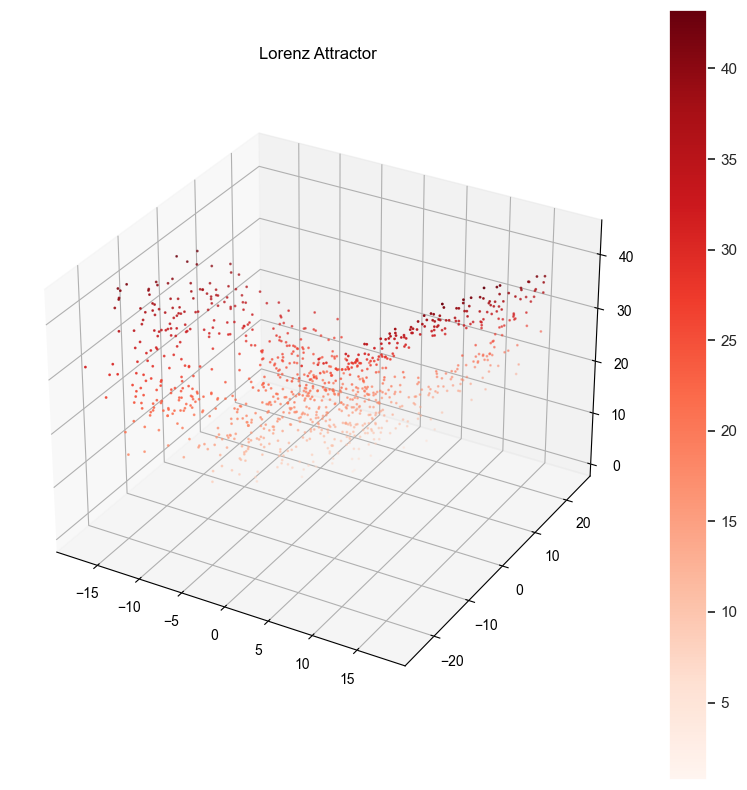

In [9]:
num_conditions = 10
t = torch.linspace(0., 1000., 1000)
x_0 = torch.tensor([1., 0., 0.])
data = []

# Generate random initial conditions and integrate the Lorenz system
for _ in range(num_conditions):
    x_0 = torch.rand(3)  # Generate a random initial condition
    result = odeint(lorenz, x_0, t)
    data.append(result)

# Convert the list of data to a NumPy array
data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
true_lorenz = odeint(lorenz, x_0, t)
visualize_3d(real=true_lorenz)

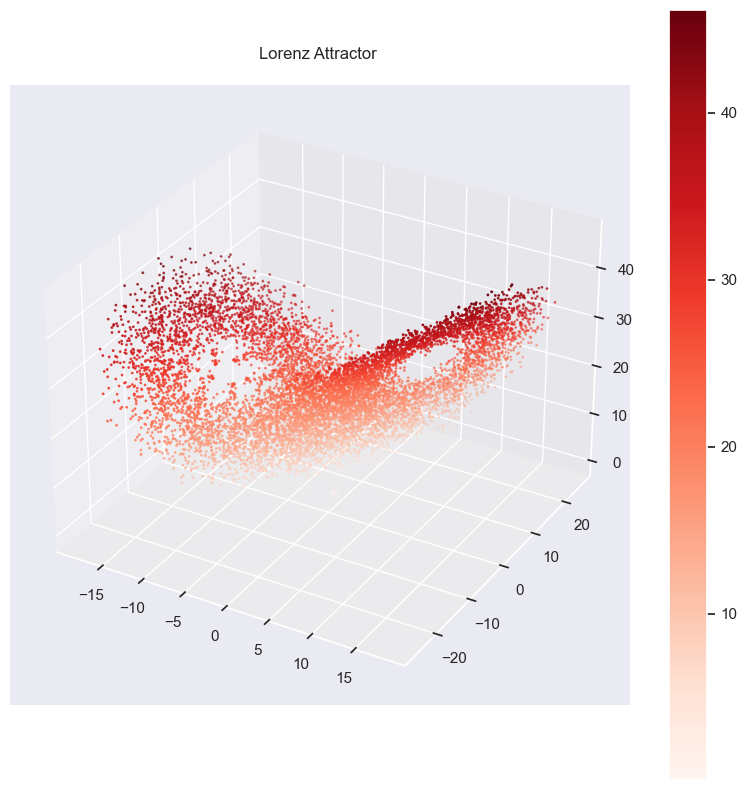

In [10]:
num_conditions = 10
t = torch.linspace(0., 1000., 1000)
x_0 = torch.tensor([1., 0., 0.])
data = []

# Generate random initial conditions and integrate the Lorenz system
for _ in range(num_conditions):
    x_0 = torch.rand(3)  # Generate a random initial condition
    result = odeint(lorenz, x_0, t)
    data.append(result)

# Convert the list of data to a NumPy array
data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
true_lorenz = odeint(lorenz, x_0, t)
visualize_3d(real=data)

In [11]:
data.shape

torch.Size([10, 1000, 3])

In [12]:
wandb_config = {
    'hidden_size': 256,
    'learning_rate': 1e-2,
    'batch_size': 50,
    'max_iterations': 3000,
}

# Initialize wandb configuration
wandb.config.update(wandb_config)

In [13]:
class LorenzTrain(nn.Module):
    """
    neural network for learning the chaotic lorenz system
    """
    def __init__(self):
        super(LorenzTrain, self).__init__()
        self.lin = nn.Linear(3, 256)
        self.lin3 = nn.Linear(256, 3)
        self.relu = nn.ReLU()

    def forward(self, t, x):
        x = self.relu(self.lin(x))
        x = self.lin3(x)
        return x
     

In [14]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [15]:
h,j,k, = get_batch(data,8)

In [16]:
len(data)

10

In [17]:
len(data[:,:])

10

In [18]:
len(data[:][:])

10

In [19]:
len(data[0][:])

1000

In [20]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y[0][:])
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [21]:
h,j,k, = get_batch(data,8)

In [22]:
def get_batch(true_y, batch_size):
    start_point= len(true_y)
    num_samples = len(true_y[0][:])
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    init_point = np.random.choice(start_point, size=1, replace=False)
    batch_y0 = true_y[init_point][indices]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[init_point][indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [23]:
h,j,k, = get_batch(data,8)

In [24]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [25]:
init_point

array([8])

In [26]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [27]:
init_point

array([8])

In [28]:
np.random.seed(7)

In [29]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [30]:
init_point

array([8])

In [31]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [32]:
init_point

array([1])

In [33]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [34]:
init_point

array([2])

In [35]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [36]:
init_point

array([9])

In [37]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [38]:
init_point

array([2])

In [39]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [40]:
init_point

array([2])

In [41]:
start_point= len(data)
init_point = np.random.choice(start_point, size=1, replace=False)

In [42]:
init_point

array([2])

In [43]:
num_samples = len(data[0][:])

In [44]:
num_samples

1000

In [45]:
data.shape

torch.Size([10, 1000, 3])

In [46]:
indices = np.random.choice(np.arange(num_samples - 8, dtype=np.int64), size=8, replace=False)

In [47]:
indices

array([666, 794, 134, 308, 164, 228, 744, 936], dtype=int64)

In [48]:
batch_y0 = data[init_point][indices]

In [49]:
batch_y0 = data[init_point]

In [50]:
batch_y0.shape

torch.Size([1, 1000, 3])

In [51]:
batch_y0[:][5]

In [52]:
batch_y0[:][5,:]

In [53]:
batch_y0[:,:5,:]

tensor([[[  0.1648,   0.8505,   0.4175],
         [ -9.5512,  -9.4190,  28.5521],
         [ -7.6488,  -8.4998,  24.7480],
         [ -8.3233,  -6.9286,  28.5524],
         [ -9.3449, -10.6173,  26.3859]]])

In [54]:
def get_batch(true_y, batch_size):
    start_point= len(true_y)
    num_samples = len(true_y[0][:])
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    init_point = np.random.choice(start_point, size=1, replace=False)
    batch_y0 = true_y[init_point,indices,:]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[init_point][indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [55]:
h,j,k, = get_batch(data,8)

In [56]:
def get_batch(true_y, batch_size):
    start_point= len(true_y)
    num_samples = len(true_y[0][:])
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    init_point = np.random.choice(start_point, size=1, replace=False)
    batch_y0 = true_y[init_point,indices,:]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[init_point,indices + i,:] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [57]:
h,j,k, = get_batch(data,8)

In [58]:
h,j,k, = get_batch(data,3)

In [59]:
h

tensor([[-5.2406, -1.5314, 28.2966],
        [-3.6512, -3.1312, 22.3802],
        [ 2.6042,  2.3520, 20.6650]])

In [60]:
j

tensor([0.0000, 1.0010, 2.0020])

In [61]:
j.shape

torch.Size([3])

In [62]:
h.shape

torch.Size([3, 3])

In [63]:
h

tensor([[-5.2406, -1.5314, 28.2966],
        [-3.6512, -3.1312, 22.3802],
        [ 2.6042,  2.3520, 20.6650]])

In [64]:
j

tensor([0.0000, 1.0010, 2.0020])

In [65]:
k.shape

torch.Size([3, 3, 3])

In [66]:
k

tensor([[[ -5.2406,  -1.5314,  28.2966],
         [ -3.6512,  -3.1312,  22.3802],
         [  2.6042,   2.3520,  20.6650]],

        [[ -3.5584,  -5.8502,  14.1113],
         [-10.9656, -16.2598,  22.6656],
         [  5.0252,   8.9821,  11.9299]],

        [[  2.9374,   5.7256,   7.2166],
         [ -5.6237,   1.2444,  31.7251],
         [-13.2197,  -6.8060,  38.9500]]])

In [67]:
data.shape

torch.Size([10, 1000, 3])

In [68]:
wandb_config = {
    'hidden_size': 256,
    'learning_rate': 1e-2,
    'batch_size': 50,
    'max_iterations': 3000,
}

# Initialize wandb configuration
wandb.config.update(wandb_config)

In [69]:
class LorenzTrain(nn.Module):
    """
    neural network for learning the chaotic lorenz system
    """
    def __init__(self):
        super(LorenzTrain, self).__init__()
        self.lin = nn.Linear(3, 256)
        self.lin3 = nn.Linear(256, 3)
        self.relu = nn.ReLU()

    def forward(self, t, x):
        x = self.relu(self.lin(x))
        x = self.lin3(x)
        return x
     

In [70]:
def get_batch(true_y, batch_size):
    start_point= len(true_y)
    num_samples = len(true_y[0][:])
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    init_point = np.random.choice(start_point, size=1, replace=False)
    batch_y0 = true_y[init_point,indices,:]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[init_point,indices + i,:] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [71]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [72]:
batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

pred_y = odeint(func, batch_y0, batch_t)

In [73]:
data = data.to(device)

In [74]:
data = data.to(device)

In [75]:
batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

pred_y = odeint(func, batch_y0, batch_t)

In [76]:
pred_y.shape,batch_y.shape,batch_y0.shape,batch_t.shape

(torch.Size([50, 50, 3]),
 torch.Size([50, 50, 3]),
 torch.Size([50, 3]),
 torch.Size([50]))

In [77]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [78]:
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(train_data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, train_data[0], t)
            loss = F.mse_loss(pred_y, train_data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=train_data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [79]:
data[0]

tensor([[ 0.6940,  0.2697,  0.0537],
        [-9.4430, -9.2170, 28.5249],
        [-7.8061, -8.6592, 24.9483],
        ...,
        [-4.1258, -7.9079,  8.4112],
        [ 7.4742,  2.5268, 31.4614],
        [ 3.4951,  5.4298, 15.4961]], device='cuda:0')

In [80]:
data[0][0]

tensor([0.6940, 0.2697, 0.0537], device='cuda:0')

In [81]:
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, data[0][0], t)
            loss = F.mse_loss(pred_y, train_data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=train_data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [82]:
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, data[0][0], t)
            loss = F.mse_loss(pred_y, train_data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [83]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-2)

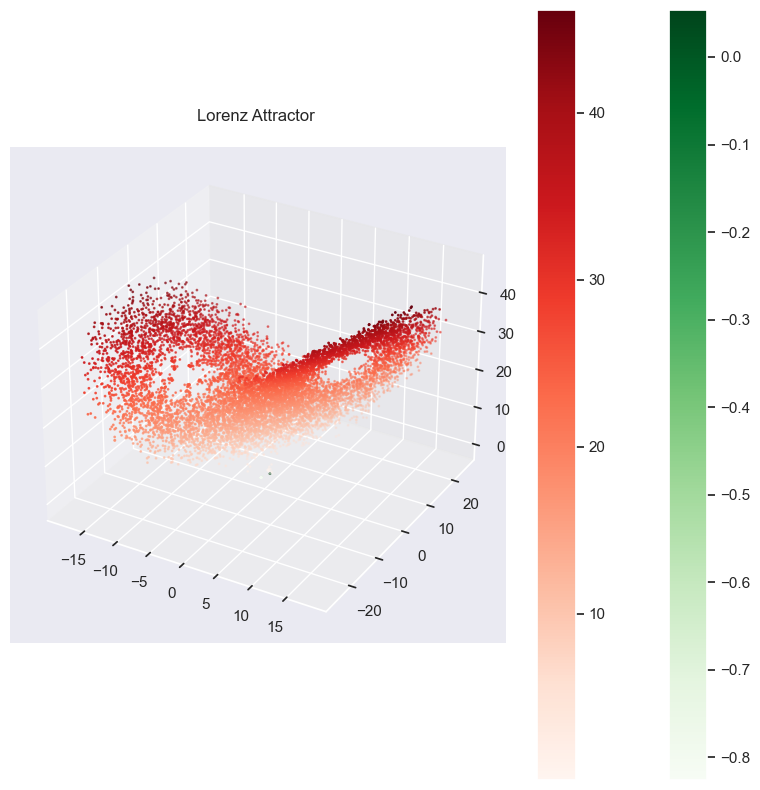

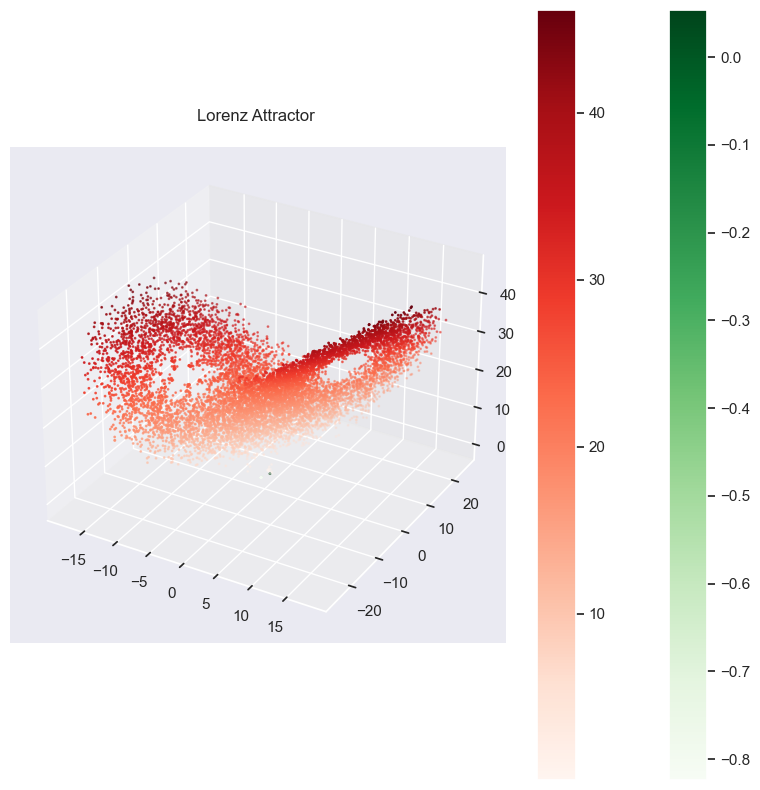

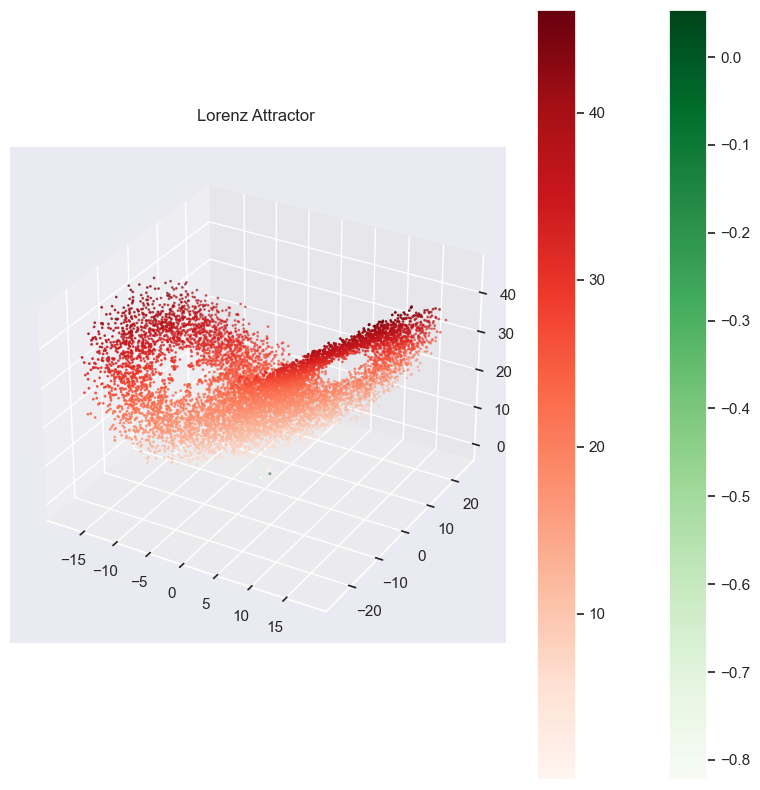

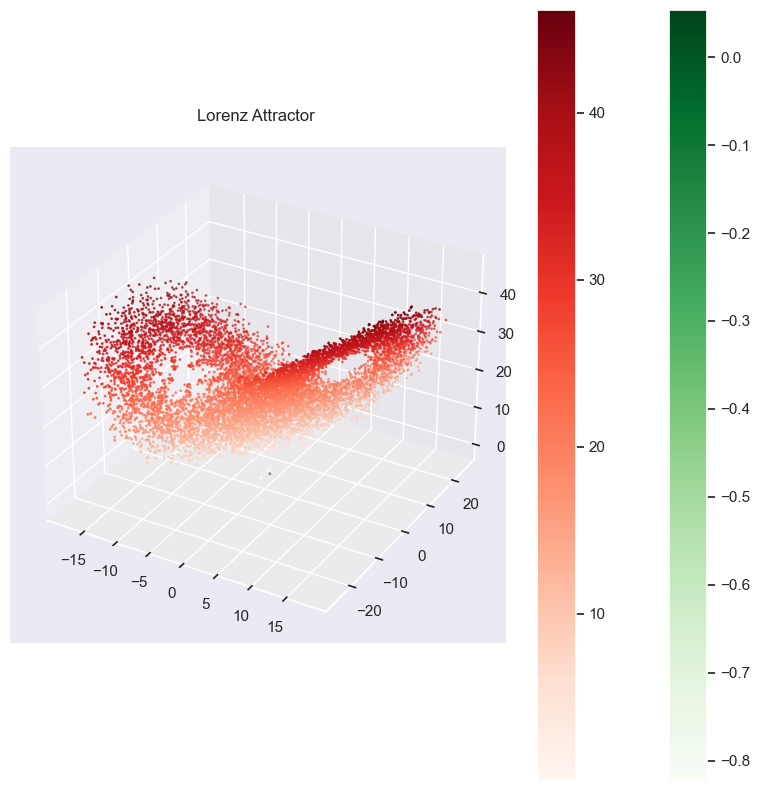

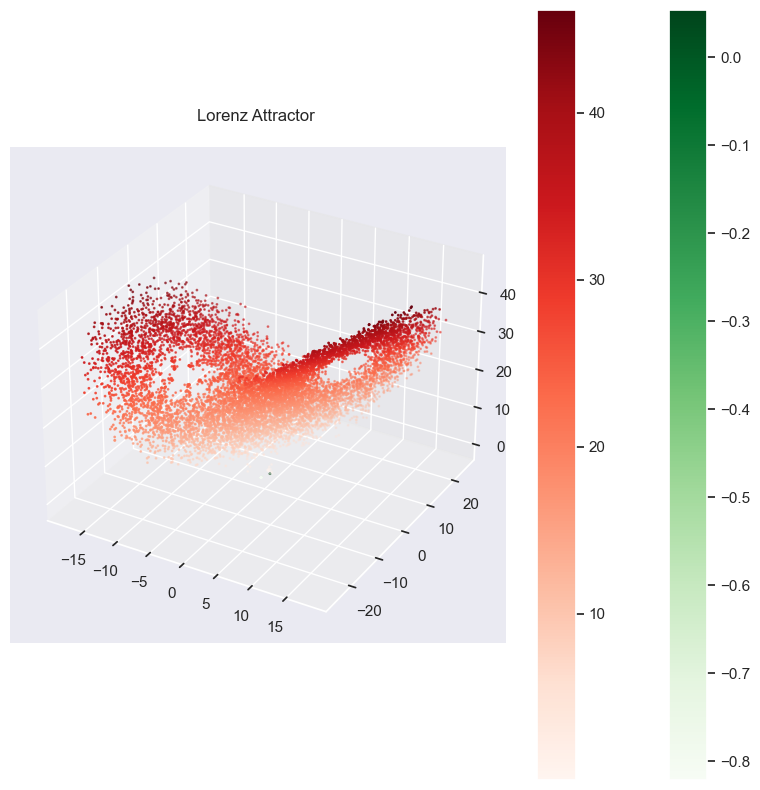

...

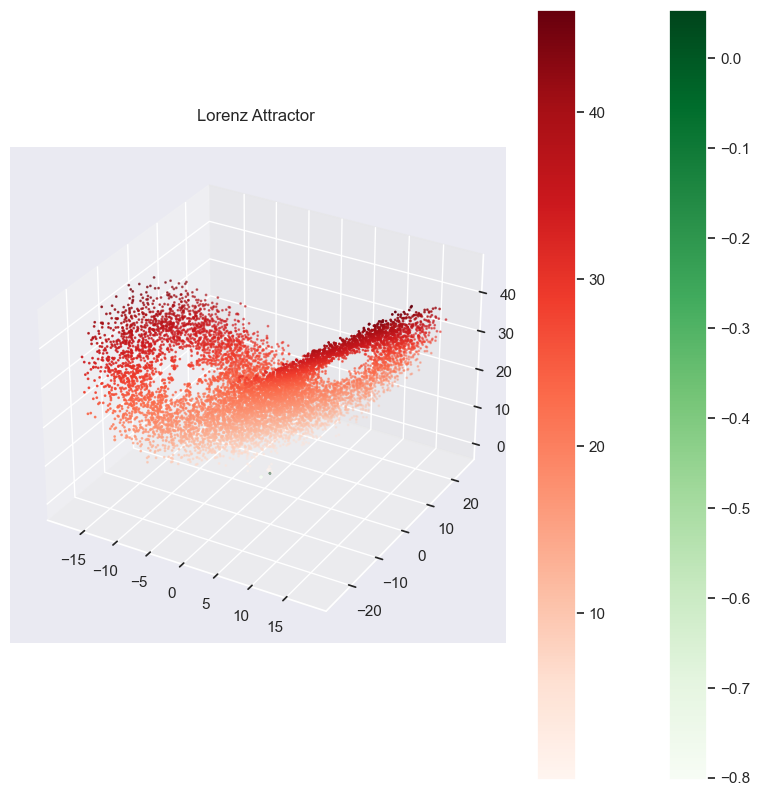

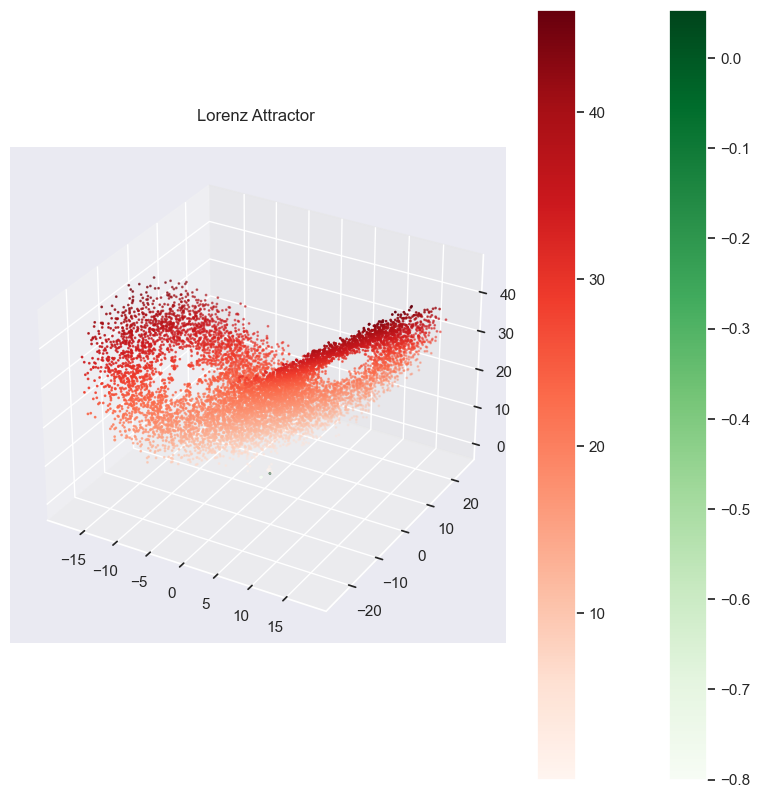

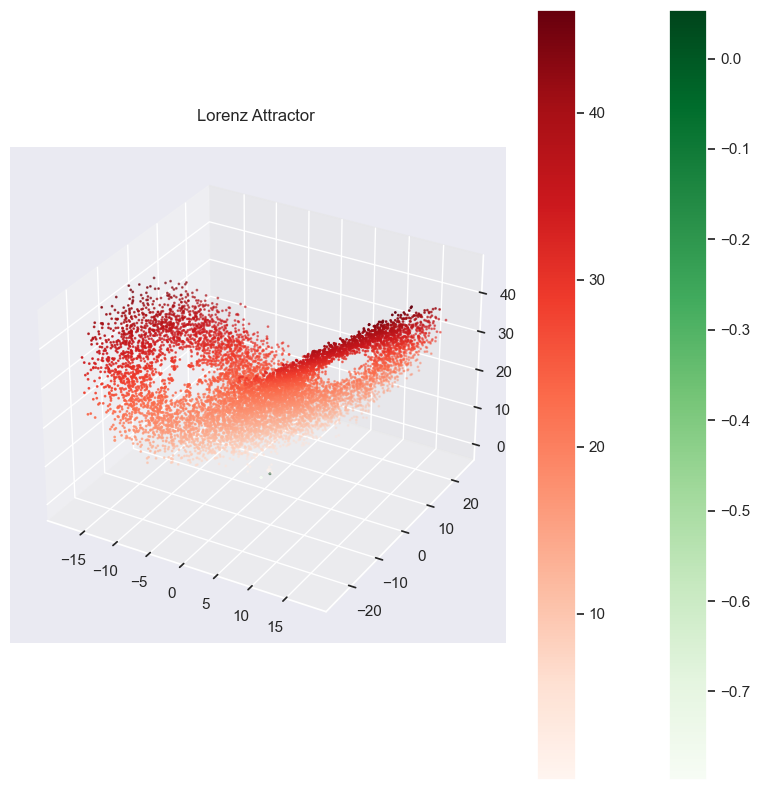

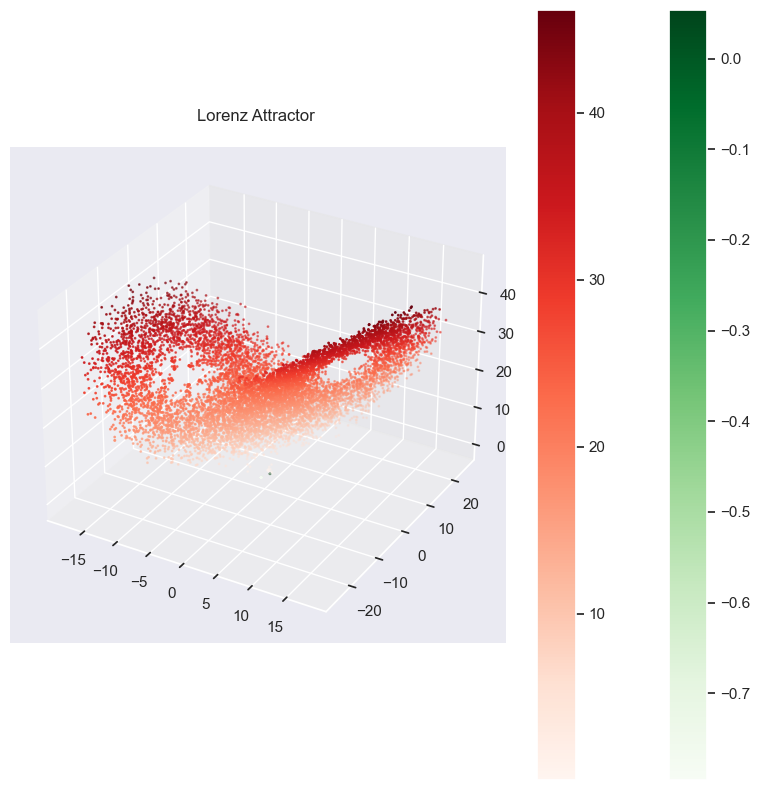

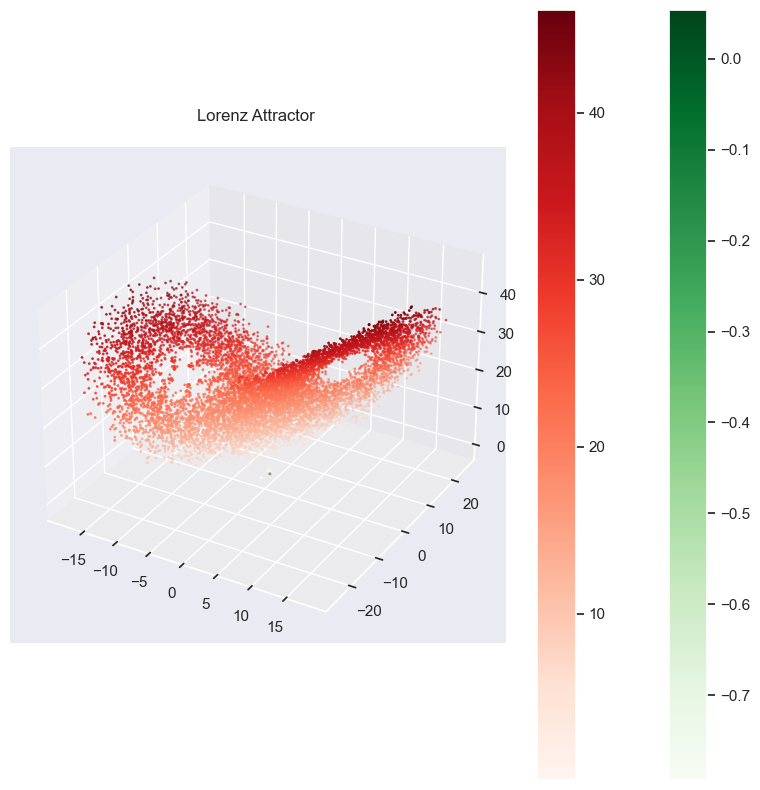

In [84]:
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, data[0][0], t)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [85]:
data[0]

tensor([[ 0.6940,  0.2697,  0.0537],
        [-9.4430, -9.2170, 28.5249],
        [-7.8061, -8.6592, 24.9483],
        ...,
        [-4.1258, -7.9079,  8.4112],
        [ 7.4742,  2.5268, 31.4614],
        [ 3.4951,  5.4298, 15.4961]], device='cuda:0')

In [86]:
data[0].shape

torch.Size([1000, 3])

In [87]:
data[:].shape

torch.Size([10, 1000, 3])

In [88]:
data[:10]

tensor([[[  0.6940,   0.2697,   0.0537],
         [ -9.4430,  -9.2170,  28.5249],
         [ -7.8061,  -8.6592,  24.9483],
         ...,
         [ -4.1258,  -7.9079,   8.4112],
         [  7.4742,   2.5268,  31.4614],
         [  3.4951,   5.4298,  15.4961]],

        [[  0.9631,   0.1405,   0.8291],
         [ -9.6215,  -9.1921,  28.9833],
         [ -7.7205,  -8.8007,  24.4893],
         ...,
         [ 13.4482,  11.3350,  35.6345],
         [  1.0952,  -0.2943,  21.8273],
         [ -3.6556,  -5.6708,  20.2756]],

        [[  0.1648,   0.8505,   0.4175],
         [ -9.5512,  -9.4190,  28.5521],
         [ -7.6488,  -8.4998,  24.7480],
         ...,
         [ 10.7049,   4.3255,  35.9575],
         [  0.1139,  -0.7530,  19.3551],
         [  5.0209,   7.7788,  17.6110]],

        ...,

        [[  0.3226,   0.8408,   0.2294],
         [ -9.4710,  -9.1585,  28.6602],
         [ -7.8226,  -8.7487,  24.8595],
         ...,
         [ -6.7871, -11.7090,  14.3358],
         [ 15.4507,  2

In [89]:
data[:10][0]

tensor([[ 0.6940,  0.2697,  0.0537],
        [-9.4430, -9.2170, 28.5249],
        [-7.8061, -8.6592, 24.9483],
        ...,
        [-4.1258, -7.9079,  8.4112],
        [ 7.4742,  2.5268, 31.4614],
        [ 3.4951,  5.4298, 15.4961]], device='cuda:0')

In [90]:
data[:10][0].shape

torch.Size([1000, 3])

In [91]:
data[:10,0]

tensor([[0.6940, 0.2697, 0.0537],
        [0.9631, 0.1405, 0.8291],
        [0.1648, 0.8505, 0.4175],
        [0.0070, 0.9847, 0.1216],
        [0.9180, 0.5162, 0.1754],
        [0.5317, 0.7915, 0.8438],
        [0.2726, 0.7164, 0.4048],
        [0.3226, 0.8408, 0.2294],
        [0.2057, 0.9795, 0.6049],
        [0.3350, 0.6458, 0.2089]], device='cuda:0')

In [92]:
data[:10,0].shape

torch.Size([10, 3])

In [93]:
data[:10,0]

tensor([[0.6940, 0.2697, 0.0537],
        [0.9631, 0.1405, 0.8291],
        [0.1648, 0.8505, 0.4175],
        [0.0070, 0.9847, 0.1216],
        [0.9180, 0.5162, 0.1754],
        [0.5317, 0.7915, 0.8438],
        [0.2726, 0.7164, 0.4048],
        [0.3226, 0.8408, 0.2294],
        [0.2057, 0.9795, 0.6049],
        [0.3350, 0.6458, 0.2089]], device='cuda:0')

In [94]:
data[0][0]

tensor([0.6940, 0.2697, 0.0537], device='cuda:0')

In [95]:
data[1][0]

tensor([0.9631, 0.1405, 0.8291], device='cuda:0')

In [96]:
data[2][0]

tensor([0.1648, 0.8505, 0.4175], device='cuda:0')

In [97]:
data[3][0]

tensor([0.0070, 0.9847, 0.1216], device='cuda:0')

In [98]:
data[9][0]

tensor([0.3350, 0.6458, 0.2089], device='cuda:0')

In [99]:
wandb_config = {
    'hidden_size': 256,
    'learning_rate': 1e-2,
    'batch_size': 50,
    'max_iterations': 1000,
}

# Initialize wandb configuration
wandb.config.update(wandb_config)

In [100]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [101]:
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, data[:10,0], t)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [102]:
pred_y = odeint(func, data[:10,0], t)

In [103]:
pred_y.shape

torch.Size([1000, 10, 3])

In [104]:
pred_y[0]

tensor([[0.6940, 0.2697, 0.0537],
        [0.9631, 0.1405, 0.8291],
        [0.1648, 0.8505, 0.4175],
        [0.0070, 0.9847, 0.1216],
        [0.9180, 0.5162, 0.1754],
        [0.5317, 0.7915, 0.8438],
        [0.2726, 0.7164, 0.4048],
        [0.3226, 0.8408, 0.2294],
        [0.2057, 0.9795, 0.6049],
        [0.3350, 0.6458, 0.2089]], device='cuda:0', grad_fn=<SelectBackward0>)

In [105]:
pred_y[1]

tensor([[ 1.5426, -0.9480,  0.2812],
        [ 2.4217, -1.8297,  0.8561],
        [ 1.6535, -1.2109,  0.9640],
        [ 1.3842, -0.9259,  0.8036],
        [ 1.9462, -1.0941,  0.4910],
        [ 2.3125, -1.7167,  1.2755],
        [ 1.6506, -1.1972,  0.8553],
        [ 1.6130, -1.0146,  0.7576],
        [ 1.9220, -1.4175,  1.2076],
        [ 1.5067, -1.0060,  0.6329]], device='cuda:0',
       grad_fn=<SelectBackward0>)

In [106]:
pred_y = pred_y.reshape(-1, 1)

In [107]:
pred_y.shape

torch.Size([30000, 1])

In [108]:
pred_y = pred_y.reshape(0, 1)

In [109]:
pred_y = odeint(func, data[:10,0], t)

In [110]:
pred_y = pred_y.reshape(0, 1)

In [111]:
pred_y.shape

torch.Size([1000, 10, 3])

In [112]:
pred_y = pred_y.permute(1, 0, 2)

In [113]:
pred_y.shape

torch.Size([10, 1000, 3])

In [114]:
pred_y[0]

tensor([[ 6.9401e-01,  2.6975e-01,  5.3651e-02],
        [ 1.5426e+00, -9.4800e-01,  2.8123e-01],
        [ 2.4318e+00, -1.8489e+00, -7.7674e-02],
        ...,
        [ 2.6015e+35, -2.1340e+35, -6.5035e+34],
        [ 2.8196e+35, -2.3129e+35, -7.0487e+34],
        [ 3.0559e+35, -2.5067e+35, -7.6395e+34]], device='cuda:0',
       grad_fn=<SelectBackward0>)

In [115]:
pred_y[1]

tensor([[ 9.6308e-01,  1.4048e-01,  8.2911e-01],
        [ 2.4217e+00, -1.8297e+00,  8.5609e-01],
        [ 3.9085e+00, -3.2440e+00,  8.4839e-02],
        ...,
        [ 3.5387e+35, -2.9028e+35, -8.8465e+34],
        [ 3.8354e+35, -3.1461e+35, -9.5881e+34],
        [ 4.1569e+35, -3.4098e+35, -1.0392e+35]], device='cuda:0',
       grad_fn=<SelectBackward0>)

In [116]:
pred_y[9]

tensor([[ 3.3499e-01,  6.4578e-01,  2.0892e-01],
        [ 1.5067e+00, -1.0060e+00,  6.3294e-01],
        [ 2.6516e+00, -2.1793e+00,  1.5903e-01],
        ...,
        [ 2.8266e+35, -2.3186e+35, -7.0662e+34],
        [ 3.0635e+35, -2.5130e+35, -7.6585e+34],
        [ 3.3203e+35, -2.7236e+35, -8.3005e+34]], device='cuda:0',
       grad_fn=<SelectBackward0>)

In [117]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [118]:
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, data[:10,0], t)
            pred_y = pred_y.permute(1, 0, 2)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [119]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([1., 0., 0.])
data = []

# Generate random initial conditions and integrate the Lorenz system
for _ in range(num_conditions):
    x_0 = torch.rand(3)  # Generate a random initial condition
    result = odeint(lorenz, x_0, t)
    data.append(result)

# Convert the list of data to a NumPy array
data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
true_lorenz = odeint(lorenz, x_0, t)

In [120]:
data.shape

torch.Size([3, 1000, 3])

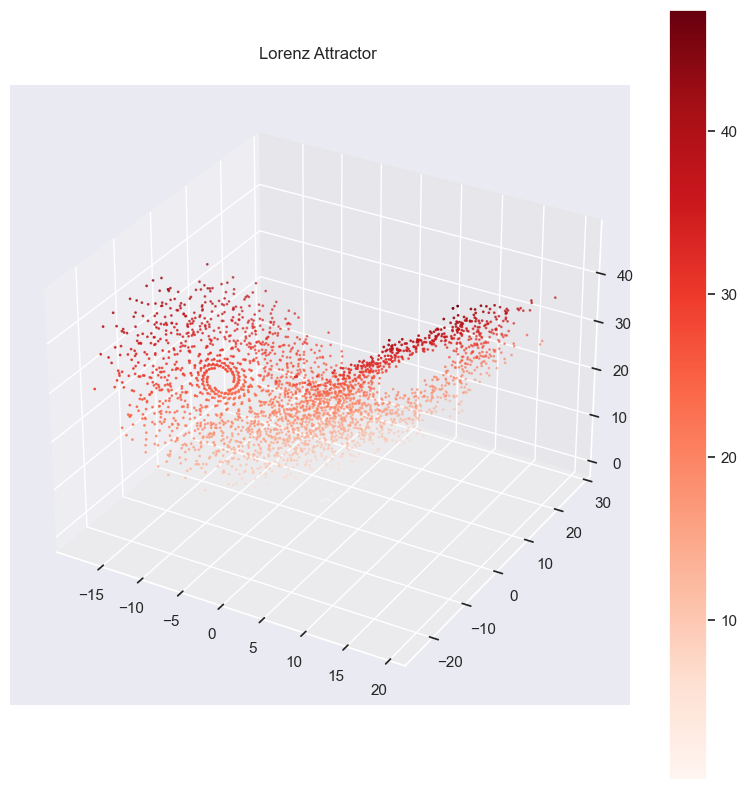

In [121]:
visualize_3d(real=data)

In [122]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [123]:
data = data.to(device)

In [124]:
t = t.to(device)

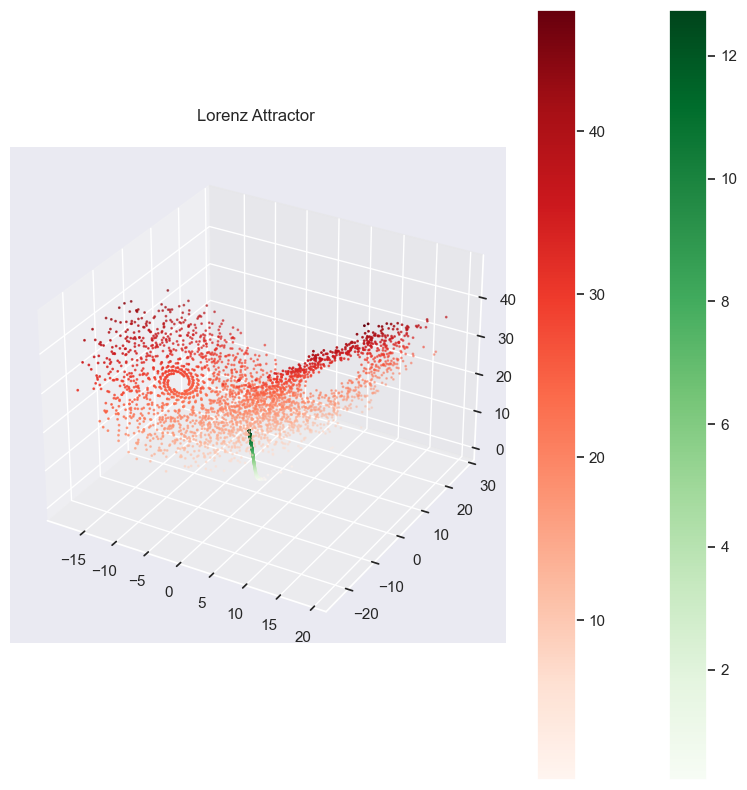

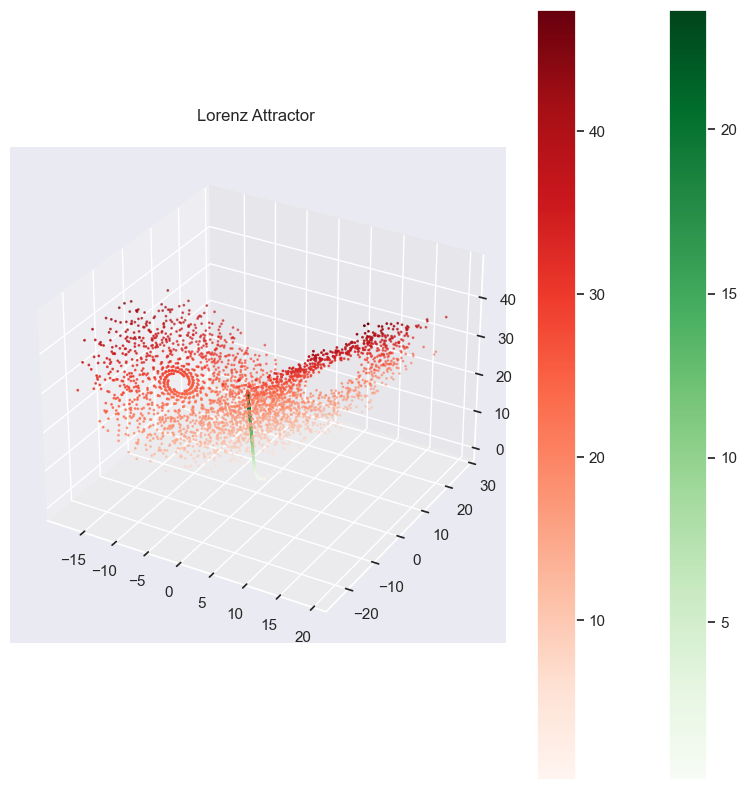

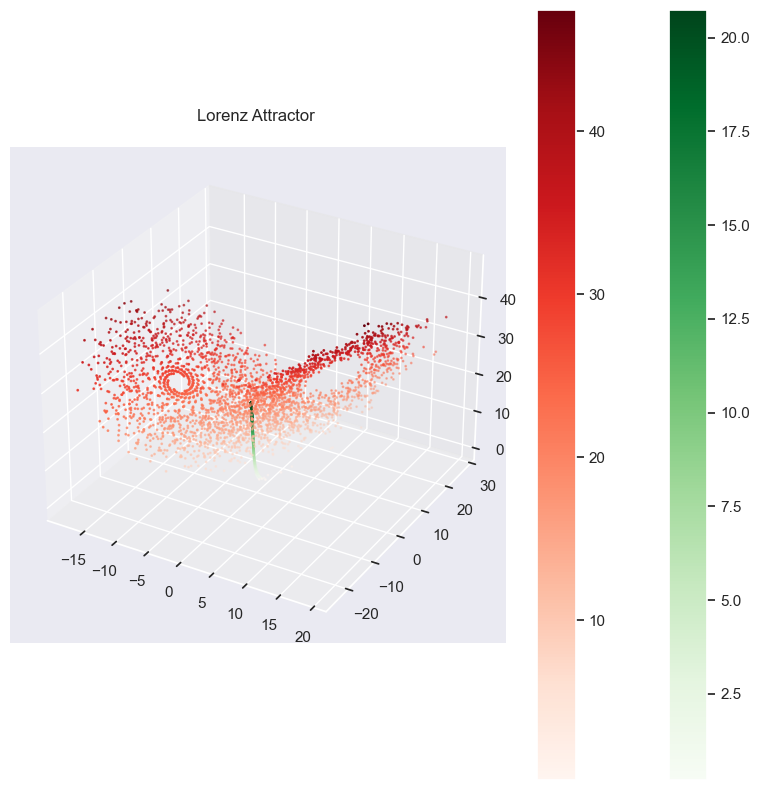

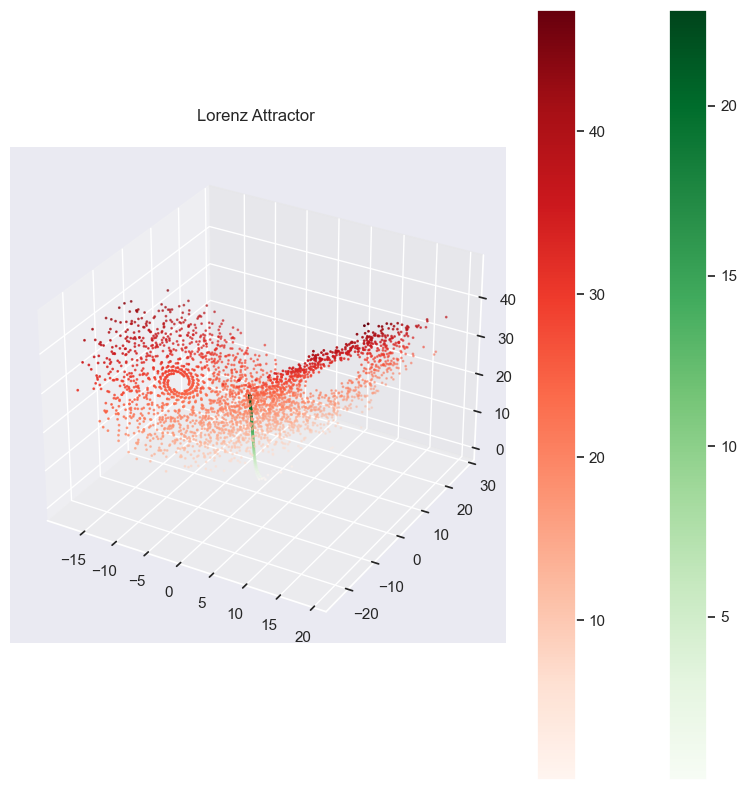

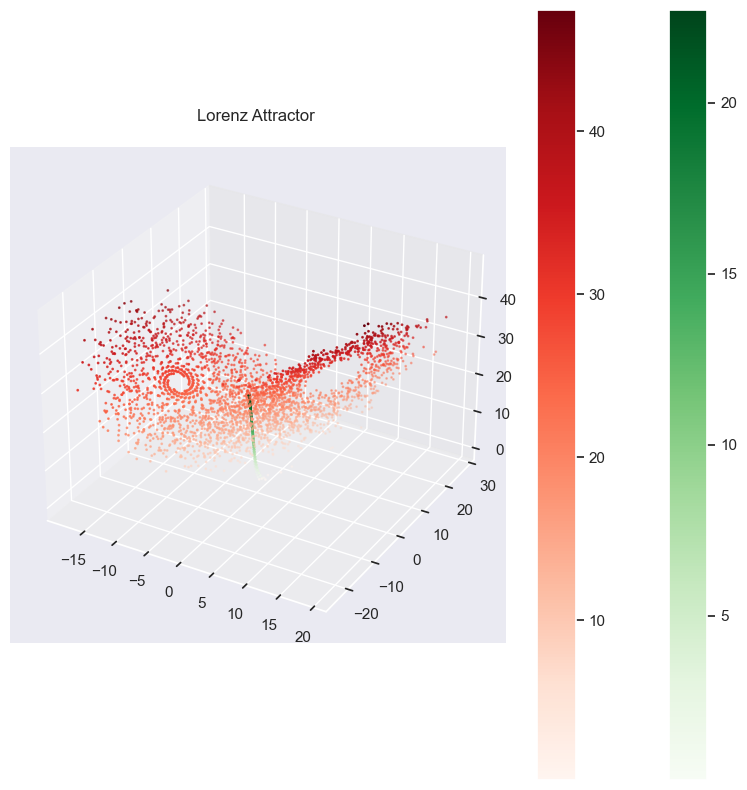

...

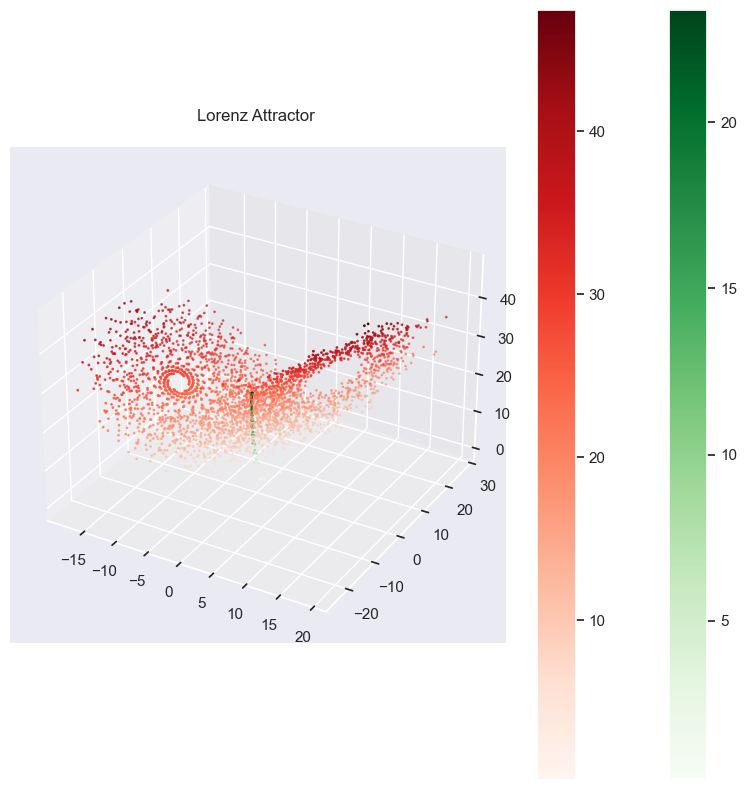

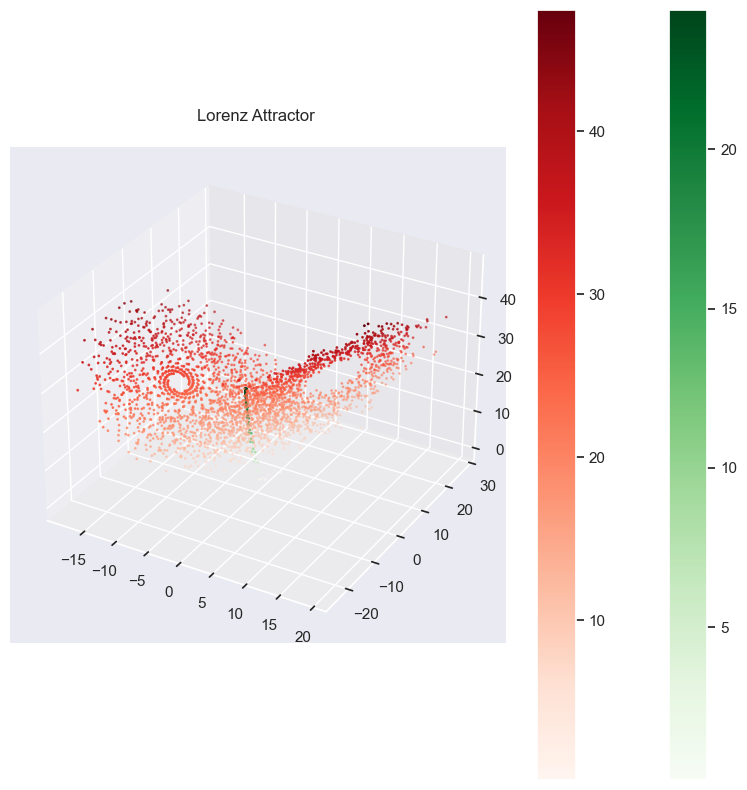

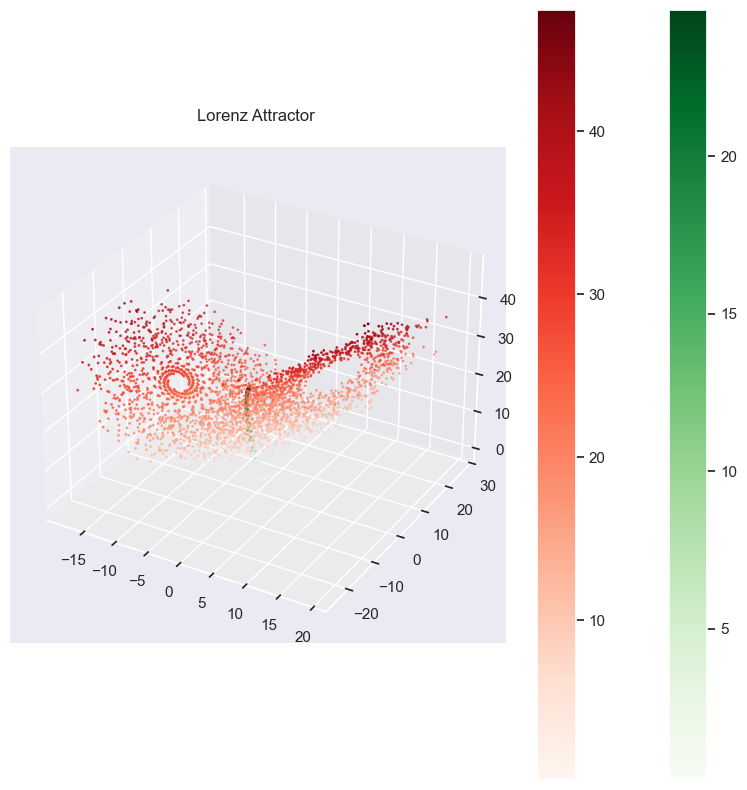

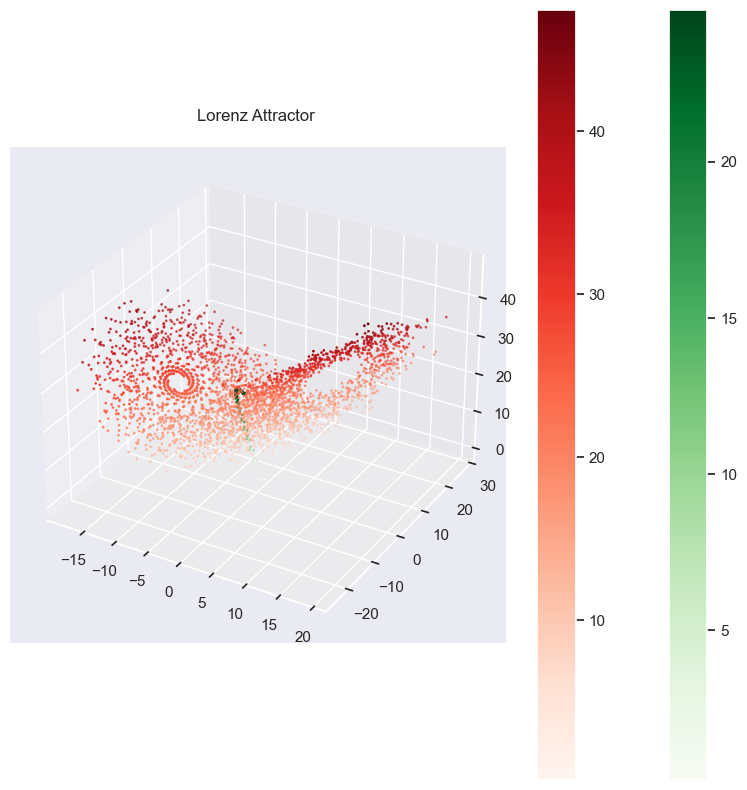

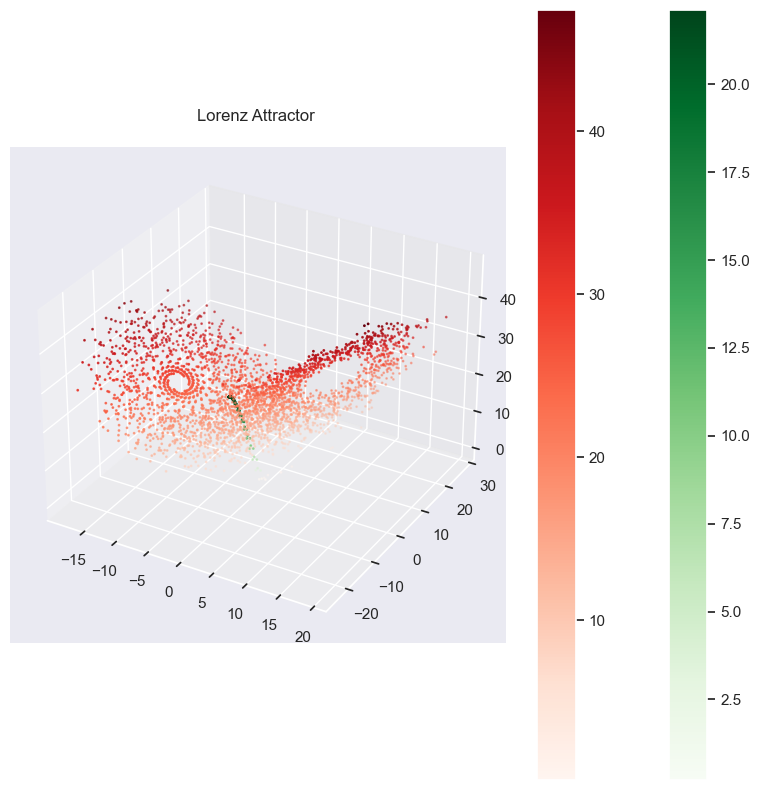

In [125]:
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, data[:10,0], t)
            pred_y = pred_y.permute(1, 0, 2)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [126]:
# Generate a more accurate simulation using the learned dynamics
num_trajectories = 1  # Number of trajectories to simulate
trajectories = []
with torch.no_grad():
    
        # Sample a random initial point from the attractor
       

        # Propagate the initial point forward in time
    predicted_trajectory = odeint(func, torch.tensor([[-8., 7., 27.]]), t)
    trajectories.append(predicted_trajectory.cpu().numpy())
    
# Convert the tensors to NumPy arrays for plotting
trajectories_np = np.array(trajectories)

In [127]:
# Generate a more accurate simulation using the learned dynamics
num_trajectories = 1  # Number of trajectories to simulate
trajectories = []
with torch.no_grad():
    
        # Sample a random initial point from the attractor
       

        # Propagate the initial point forward in time
    predicted_trajectory = odeint(func, torch.tensor([[-8., 7., 27.]]).to(device), t)
    trajectories.append(predicted_trajectory.cpu().numpy())
    
# Convert the tensors to NumPy arrays for plotting
trajectories_np = np.array(trajectories)

In [128]:
trajectories_np.shape

(1, 1000, 1, 3)

In [129]:
data.shape

torch.Size([3, 1000, 3])

In [130]:
# Extract the x, y, z coordinates from predictions_plt
x_pred = trajectories_np[:, 0:, :, 0]
y_pred = trajectories_np[:, 0:, :, 1]
z_pred = trajectories_np[:, 0:, :, 2]

# Extract the x, y, z coordinates from X_train_plt
x_train = train_data[0:, :, 0]
y_train = train_data[ 0:, :, 1]
z_train = train_data[ 0:, :, 2]

# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='X_test',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [131]:
# Extract the x, y, z coordinates from predictions_plt
x_pred = trajectories_np[:, 0:, :, 0]
y_pred = trajectories_np[:, 0:, :, 1]
z_pred = trajectories_np[:, 0:, :, 2]

# Extract the x, y, z coordinates from X_train_plt
x_train = train_data[0:, :, 0]
y_train = train_data[ 0:, :, 1]
z_train = train_data[ 0:, :, 2]

# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='X_test',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [132]:
# Extract the x, y, z coordinates from predictions_plt
x_pred = trajectories_np[:, 0:, :, 0]
y_pred = trajectories_np[:, 0:, :, 1]
z_pred = trajectories_np[:, 0:, :, 2]

# Extract the x, y, z coordinates from X_train_plt
x_train = data[0:, :, 0]
y_train = data[ 0:, :, 1]
z_train = data[ 0:, :, 2]

# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='X_test',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

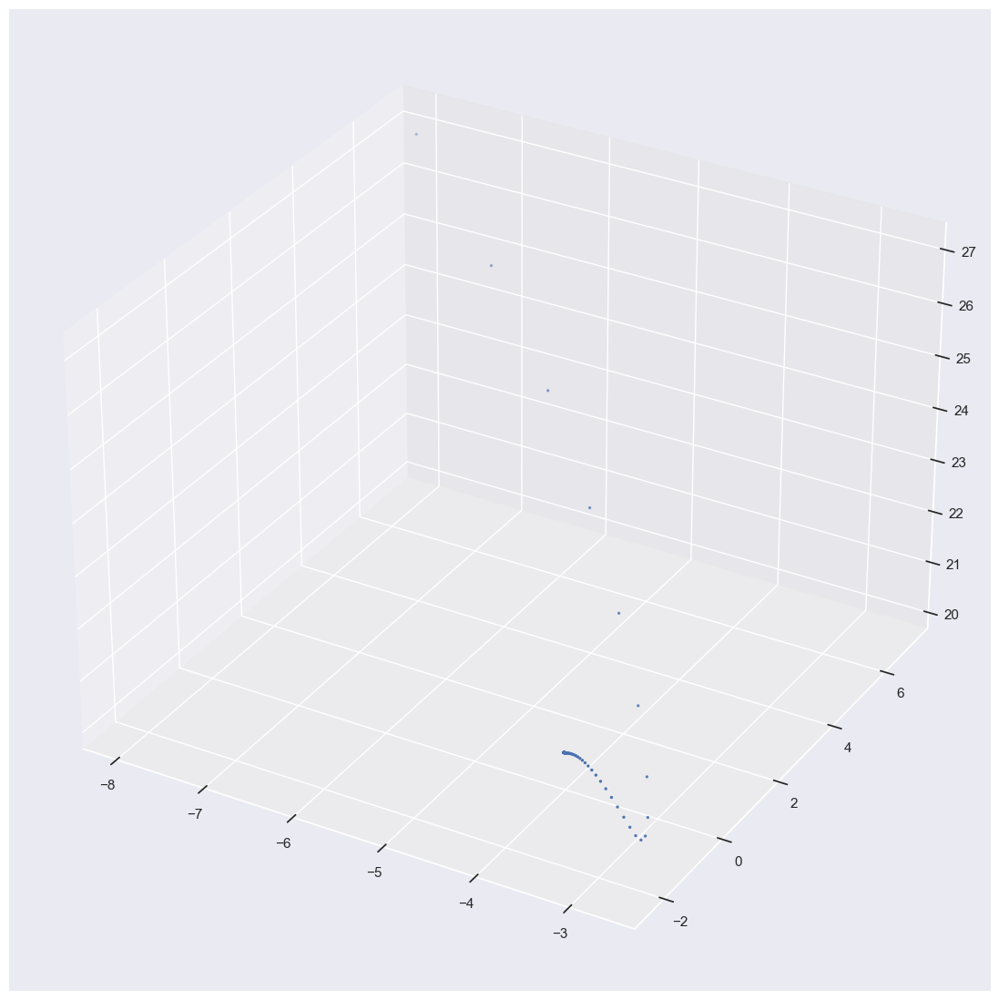

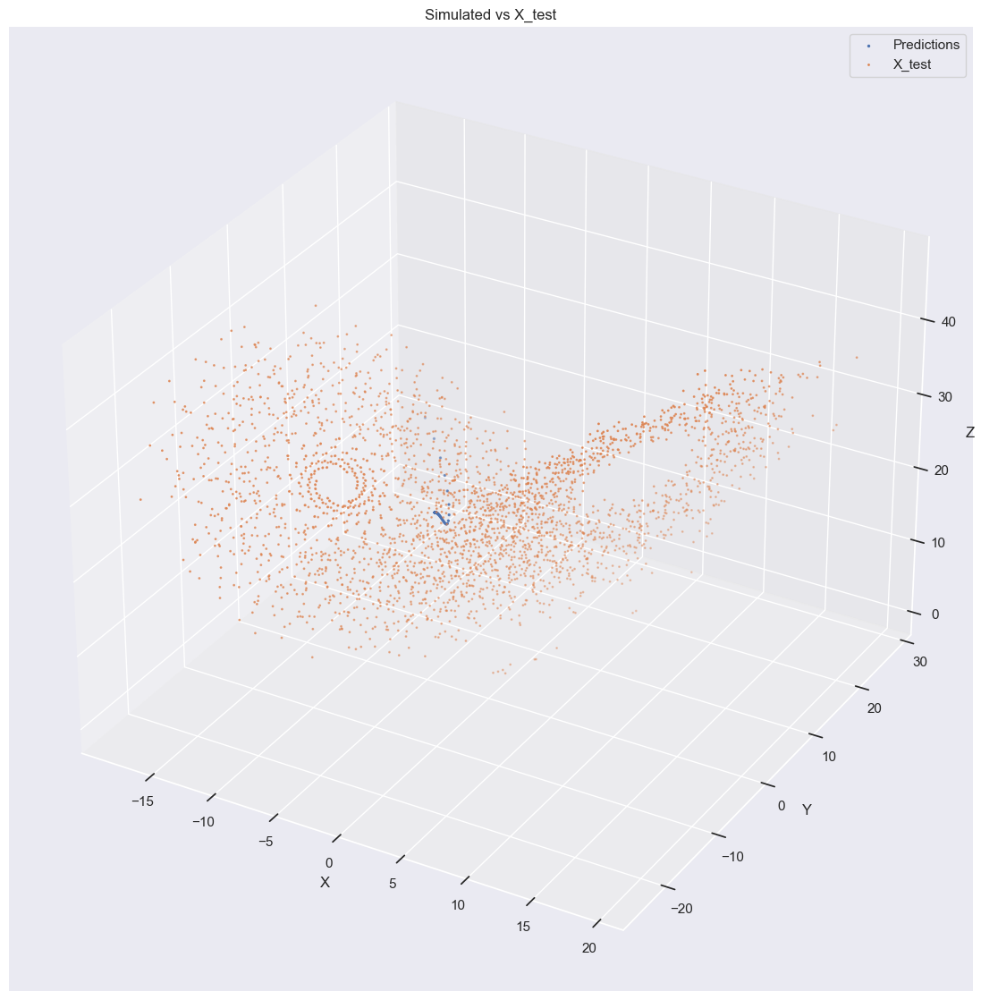

In [133]:
# Extract the x, y, z coordinates from predictions_plt
x_pred = trajectories_np[:, 0:, :, 0]
y_pred = trajectories_np[:, 0:, :, 1]
z_pred = trajectories_np[:, 0:, :, 2]

# Extract the x, y, z coordinates from X_train_plt
x_train = data[0:, :, 0].cpu()
y_train = data[ 0:, :, 1].cpu()
z_train = data[ 0:, :, 2].cpu()

# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='X_test',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [134]:
num_conditions = 1
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([1., 0., 0.])
data = []

# Generate random initial conditions and integrate the Lorenz system
for _ in range(num_conditions):
    x_0 = torch.rand(3)  # Generate a random initial condition
    result = odeint(lorenz, x_0, t)
    data.append(result)

# Convert the list of data to a NumPy array
data = torch.stack(data, dim=0)
# Define the time values

In [135]:
data.shape

torch.Size([1, 1000, 3])

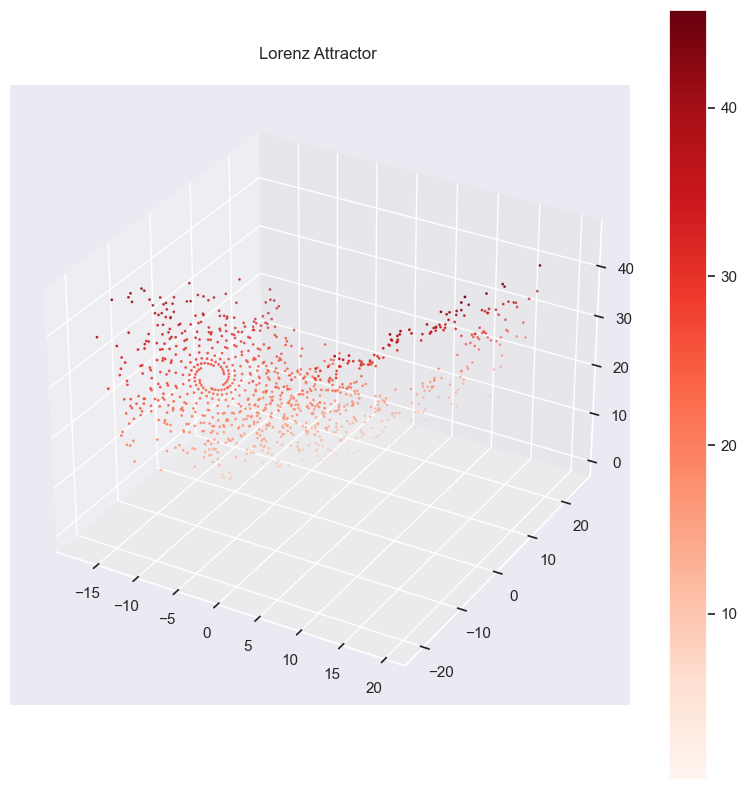

In [136]:
visualize_3d(real=data)

In [137]:
# Generate a more accurate simulation using the learned dynamics
num_trajectories = 1  # Number of trajectories to simulate
trajectories = []
with torch.no_grad():
    
        # Sample a random initial point from the attractor
       

        # Propagate the initial point forward in time
    predicted_trajectory = odeint(func, x0.to(device), t)
    trajectories.append(predicted_trajectory.cpu().numpy())
    
# Convert the tensors to NumPy arrays for plotting
trajectories_np = np.array(trajectories)

In [138]:
# Generate a more accurate simulation using the learned dynamics
num_trajectories = 1  # Number of trajectories to simulate
trajectories = []
with torch.no_grad():
    
        # Sample a random initial point from the attractor
       

        # Propagate the initial point forward in time
    predicted_trajectory = odeint(func, x_0.to(device), t)
    trajectories.append(predicted_trajectory.cpu().numpy())
    
# Convert the tensors to NumPy arrays for plotting
trajectories_np = np.array(trajectories)

In [139]:
trajectories_np.shape

(1, 1000, 3)

In [140]:
data.shape

torch.Size([1, 1000, 3])

In [141]:
# Extract the x, y, z coordinates from predictions_plt
x_pred = trajectories_np[:, 0:, :, 0]
y_pred = trajectories_np[:, 0:, :, 1]
z_pred = trajectories_np[:, 0:, :, 2]

# Extract the x, y, z coordinates from X_train_plt
x_train = data[0:, :, 0].cpu()
y_train = data[ 0:, :, 1].cpu()
z_train = data[ 0:, :, 2].cpu()

# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='X_test',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [142]:
# Extract the x, y, z coordinates from predictions_plt
x_pred = trajectories_np[:, 0:, :, 0]
y_pred = trajectories_np[:, 0:, :, 1]
z_pred = trajectories_np[:, 0:, :, 2]

# Extract the x, y, z coordinates from X_train_plt
x_train = data[0:, :, 0].cpu()
y_train = data[ 0:, :, 1].cpu()
z_train = data[ 0:, :, 2].cpu()

# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='X_test',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

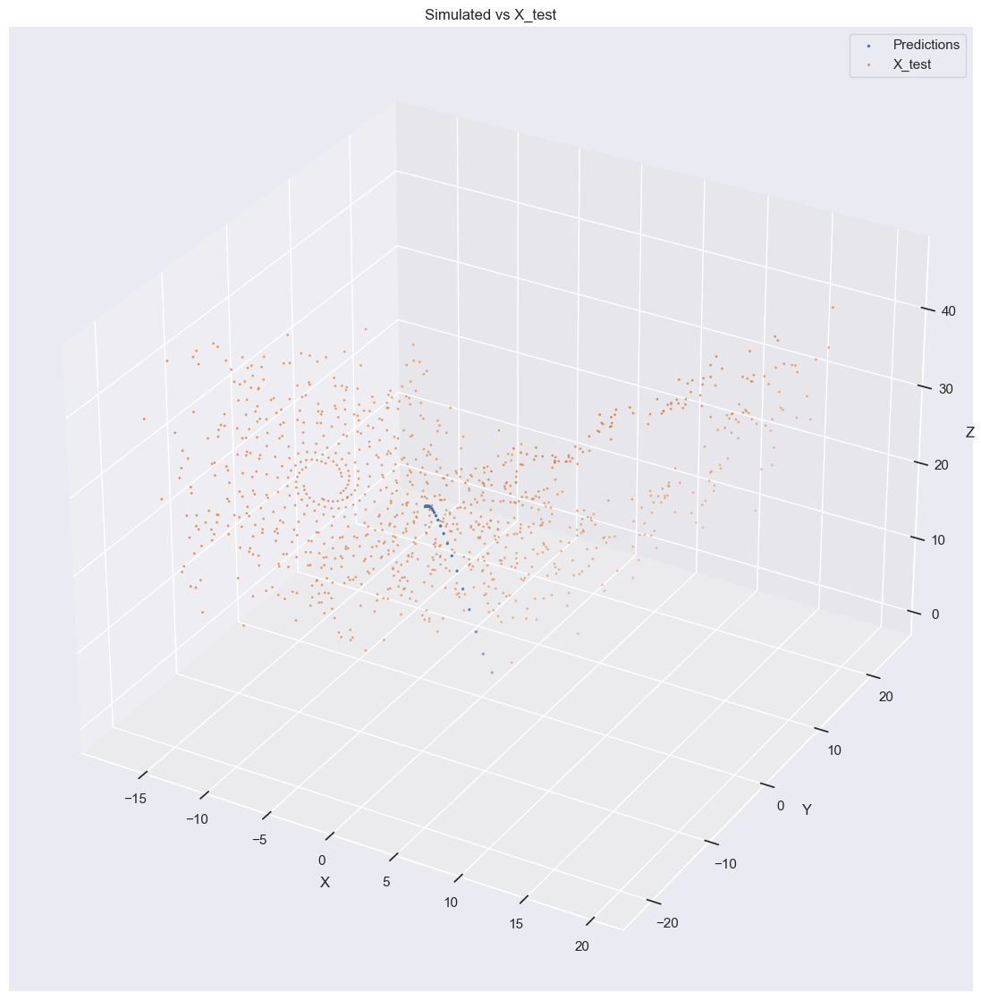

In [143]:
# Extract the x, y, z coordinates from predictions_plt
x_pred = trajectories_np[:, :, 0]
y_pred = trajectories_np[:, :, 1]
z_pred = trajectories_np[:, :, 2]

# Extract the x, y, z coordinates from X_train_plt
x_train = data[0:, :, 0].cpu()
y_train = data[ 0:, :, 1].cpu()
z_train = data[ 0:, :, 2].cpu()

# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='X_test',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [144]:
num_conditions = 1
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([1., 0., 0.])
data = []

# Generate random initial conditions and integrate the Lorenz system
for _ in range(num_conditions):
    x_0 = torch.rand(3)  # Generate a random initial condition
    result = odeint(lorenz, x_0, t)
    data.append(result)

# Convert the list of data to a NumPy array
data = torch.stack(data, dim=0)
# Define the time values

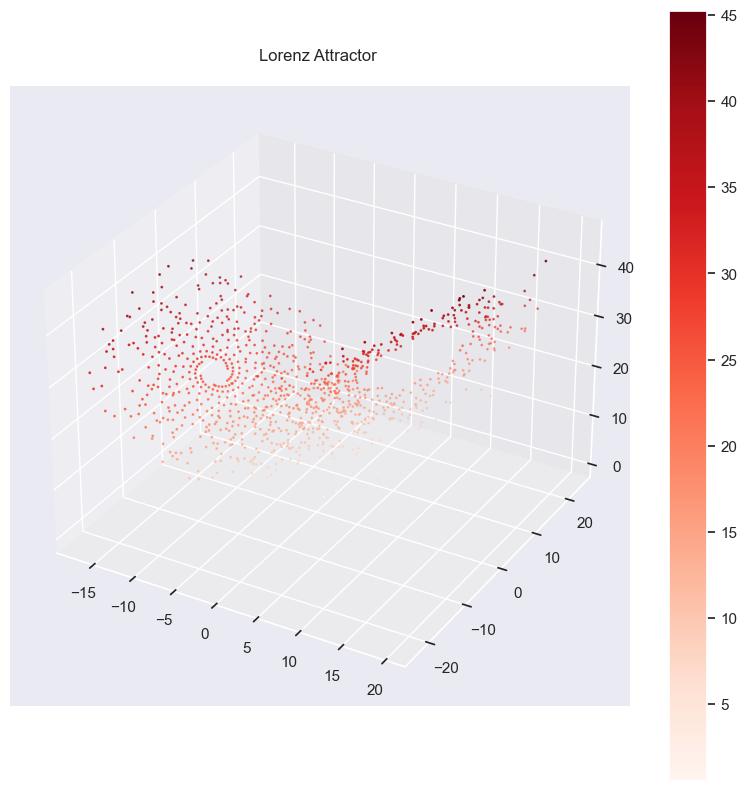

In [145]:
visualize_3d(real=data)

In [146]:
wandb_config = {
    'hidden_size': 256,
    'learning_rate': 1e-2,
    'batch_size': 50,
    'max_iterations': 1000,
}

# Initialize wandb configuration
wandb.config.update(wandb_config)

In [147]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [148]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-3)

In [149]:
data = data.to(device)

In [150]:
t = t.to(device)

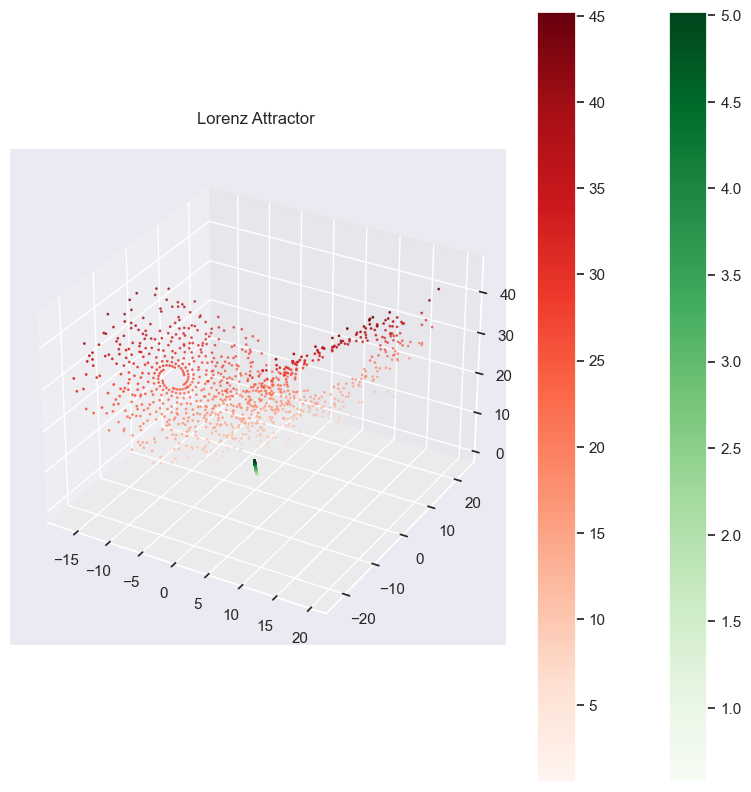

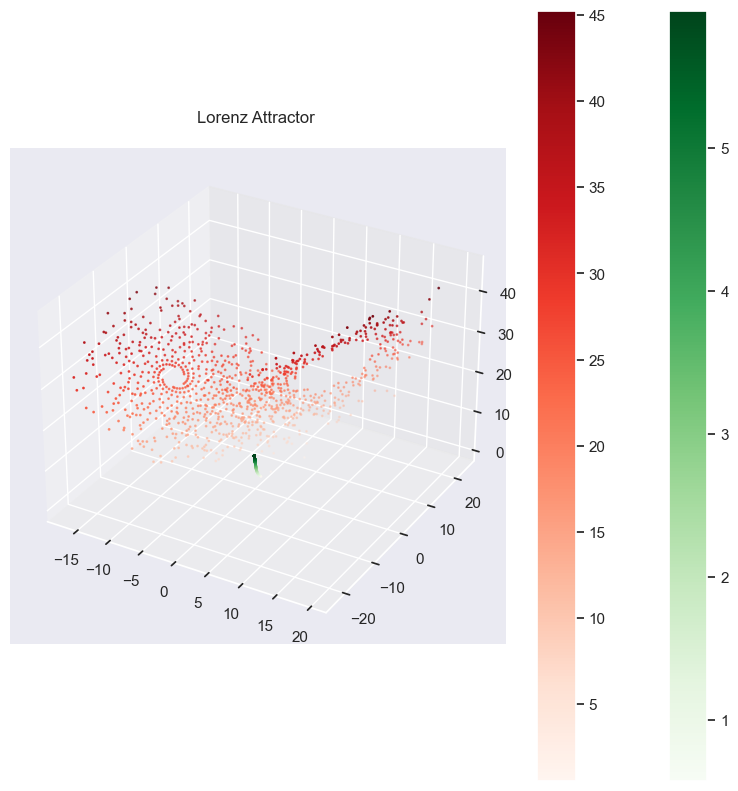

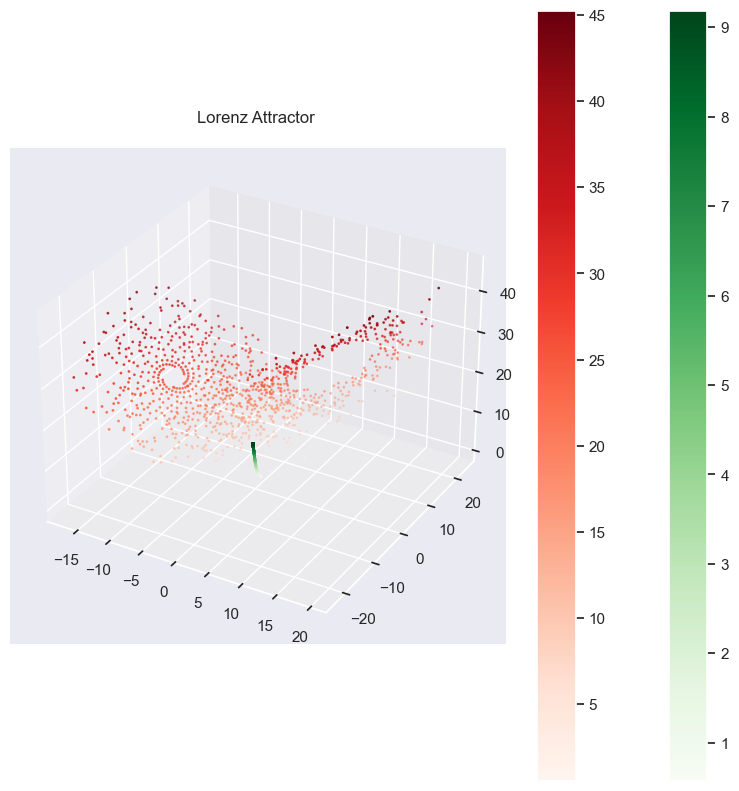

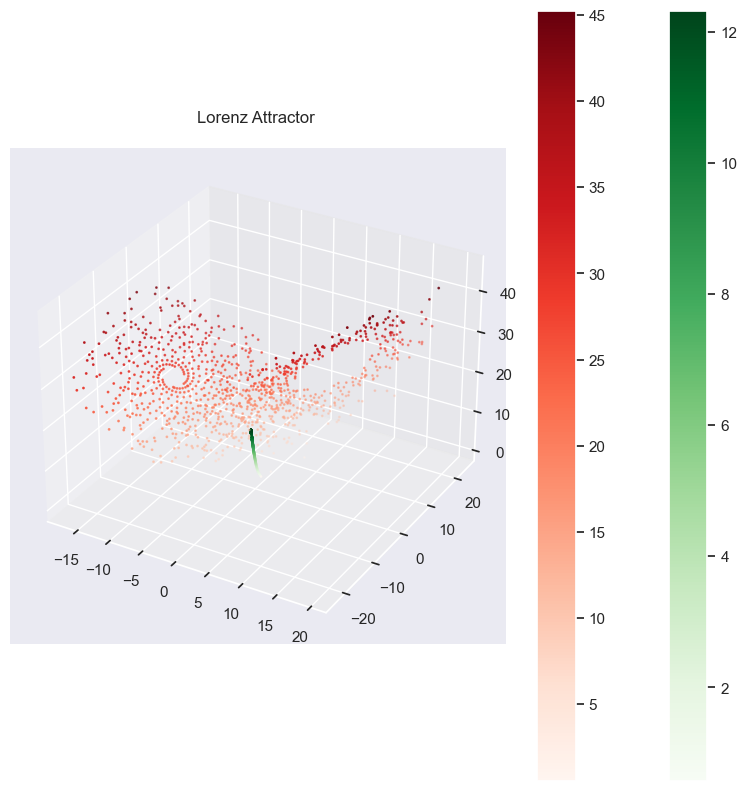

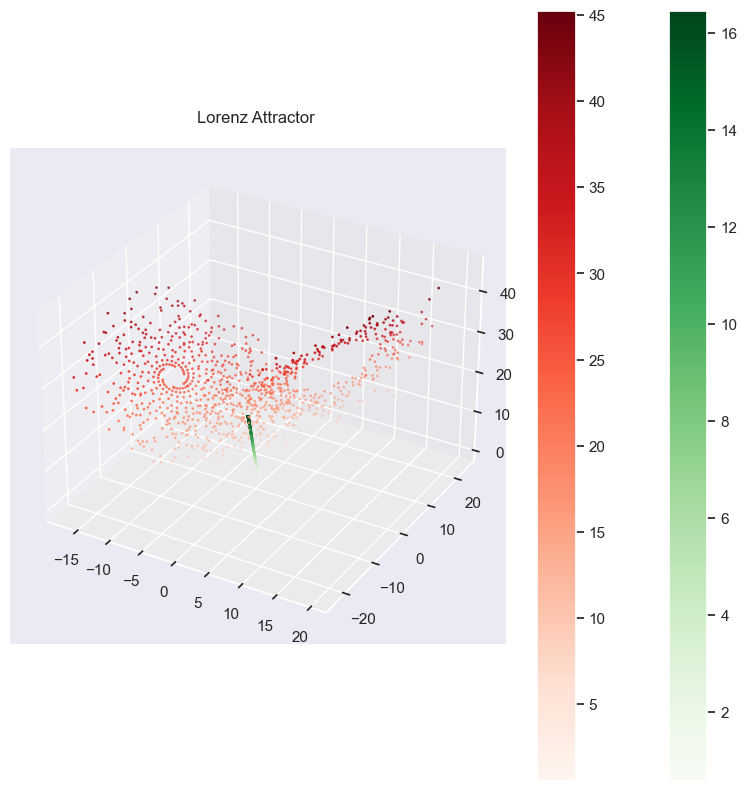

...

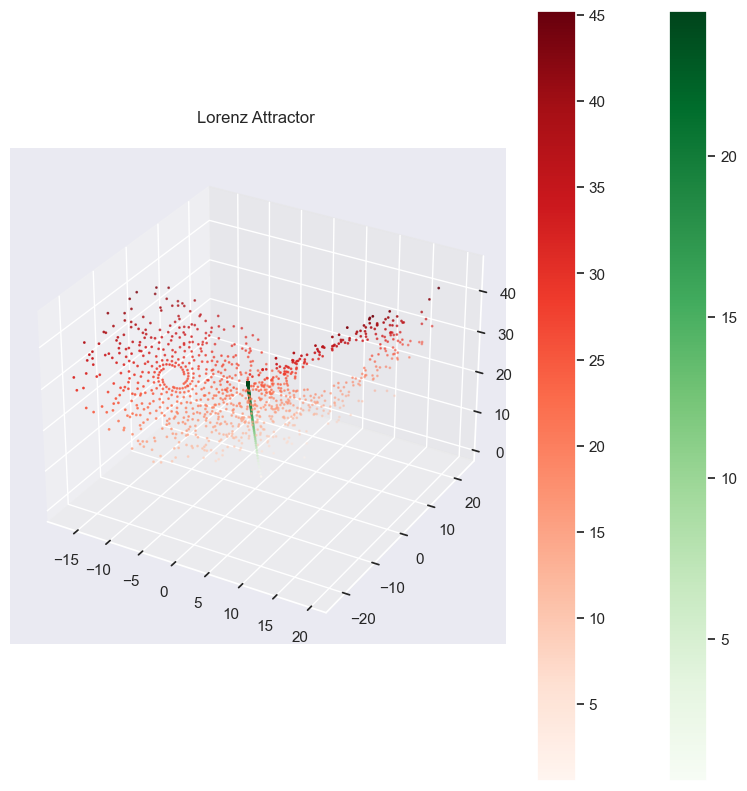

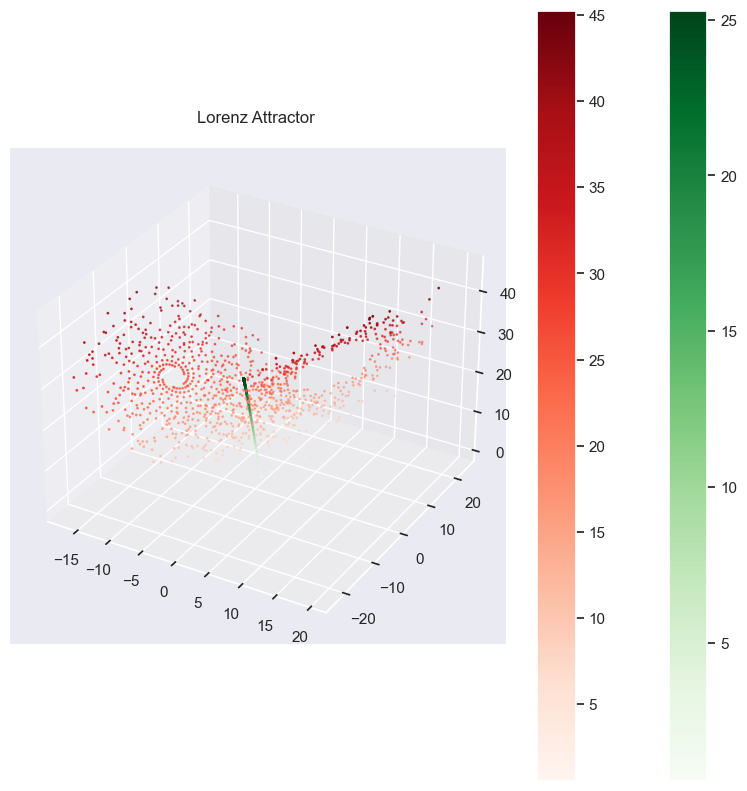

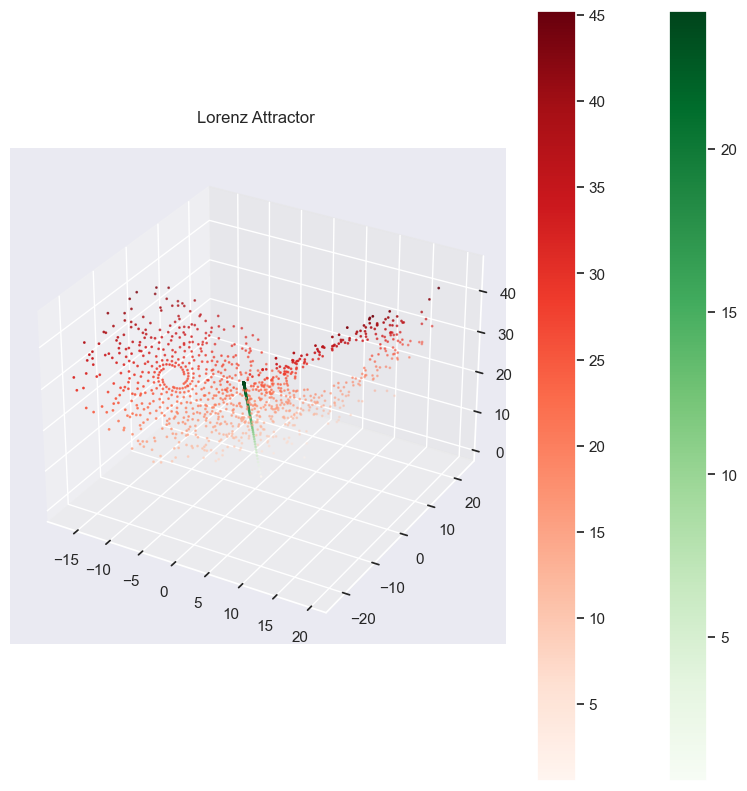

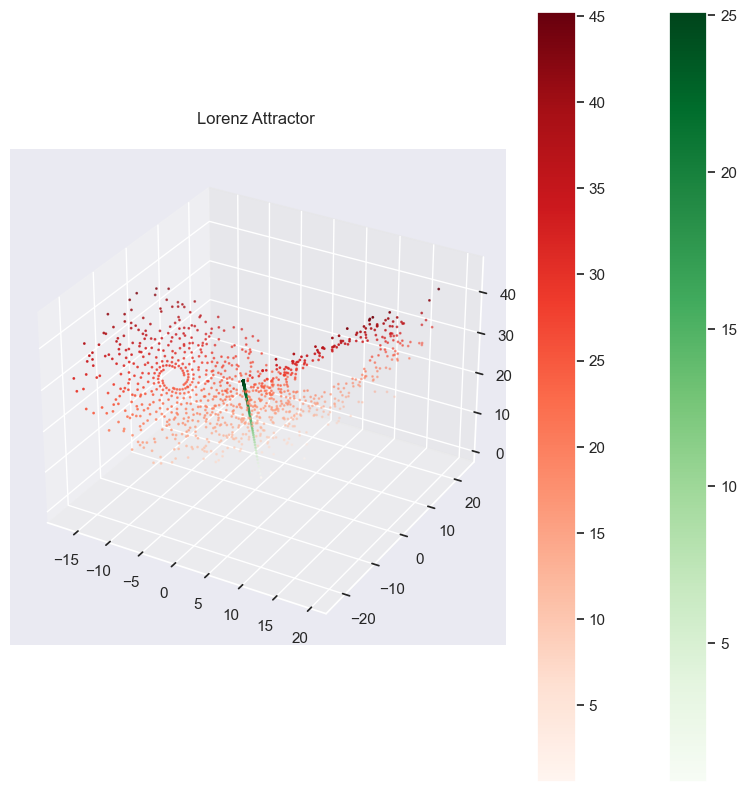

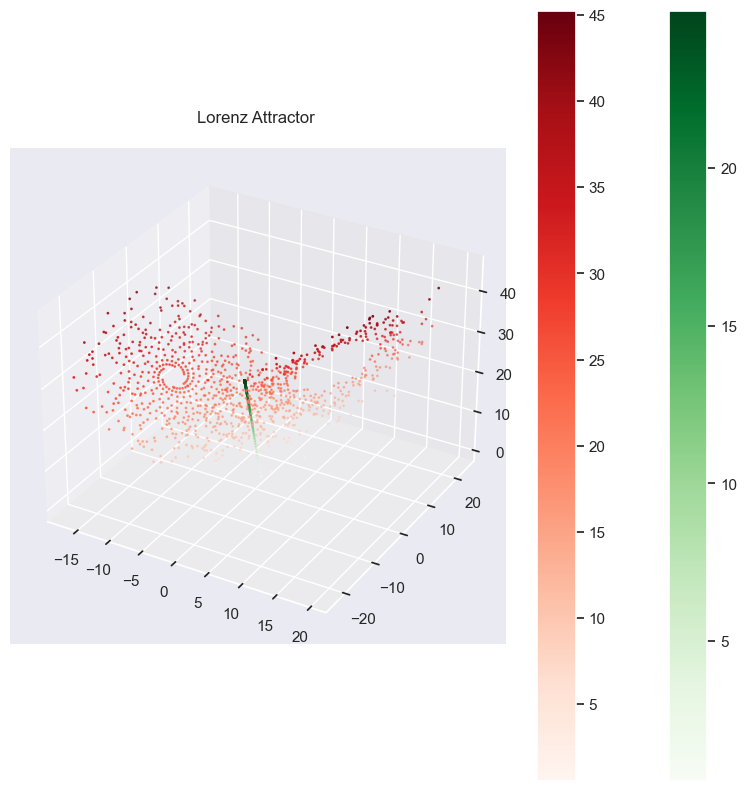

In [151]:
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 800:
            optimizer.param_groups[0]['lr'] = 1e-4
        with torch.no_grad():
            pred_y = odeint(func, data[:10,0], t)
            pred_y = pred_y.permute(1, 0, 2)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [152]:
data[:10,0]

tensor([[0.7433, 0.3470, 0.5720]], device='cuda:0')

In [153]:
data[0]

tensor([[  0.7433,   0.3470,   0.5720],
        [  1.2451,   2.5677,   0.5538],
        [  3.8682,   8.3055,   1.5803],
        ...,
        [-10.9448,  -7.5856,  33.6128],
        [ -6.9522,  -3.3167,  29.6691],
        [ -4.5799,  -3.5052,  24.2519]], device='cuda:0')

In [154]:
h,j,k = get_batch(data,5)

In [155]:
h

tensor([[-10.7020, -15.3168,  23.3514],
        [ 12.7393,  12.5203,  32.8119],
        [  7.8956,  15.2649,   9.7897],
        [  1.1521,   2.1251,   9.7875],
        [  5.3046,  -0.5226,  30.5446]], device='cuda:0')

In [156]:
j

tensor([0.0000, 0.1001, 0.2002, 0.3003, 0.4004], device='cuda:0')

In [157]:
k

tensor([[[-10.7020, -15.3168,  23.3514],
         [ 12.7393,  12.5203,  32.8119],
         [  7.8956,  15.2649,   9.7897],
         [  1.1521,   2.1251,   9.7875],
         [  5.3046,  -0.5226,  30.5446]],

        [[-13.2306, -12.3156,  34.1876],
         [  9.5279,   4.5052,  33.5501],
         [ 16.5507,  23.2312,  31.0532],
         [  2.7857,   5.3324,   8.1164],
         [  1.6131,  -0.2840,  23.2322]],

        [[ -9.0788,  -3.2963,  33.7489],
         [  5.1692,   2.1075,  27.4836],
         [ 13.1406,   0.9685,  42.7565],
         [  6.9983,  13.2999,  10.1409],
         [  0.6884,   0.4400,  17.7940]],

        [[ -4.3920,  -1.3109,  26.9017],
         [  3.5460,   3.1933,  21.9441],
         [  1.9408,  -5.8683,  30.7151],
         [ 14.9838,  22.5842,  26.7801],
         [  0.7980,   1.2165,  13.6757]],

        [[ -2.7987,  -2.4492,  21.1141],
         [  4.1874,   5.7778,  18.2559],
         [ -2.8671,  -5.6526,  24.0001],
         [ 14.5706,   5.1155,  42.8262],
        

In [158]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([1., 0., 0.])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
data = odeint(lorenz, x_0, t)

In [159]:
data.shape

torch.Size([1000, 3])

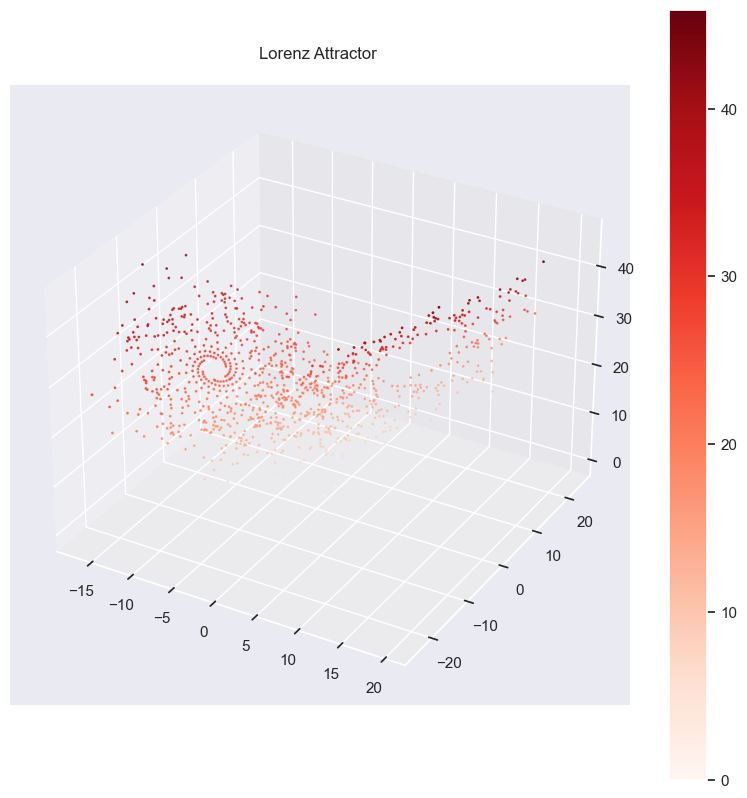

In [160]:
visualize_3d(real=data)

In [161]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([-8., 7., 27.])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
data = odeint(lorenz, x_0, t)

In [162]:
data.shape

torch.Size([1000, 3])

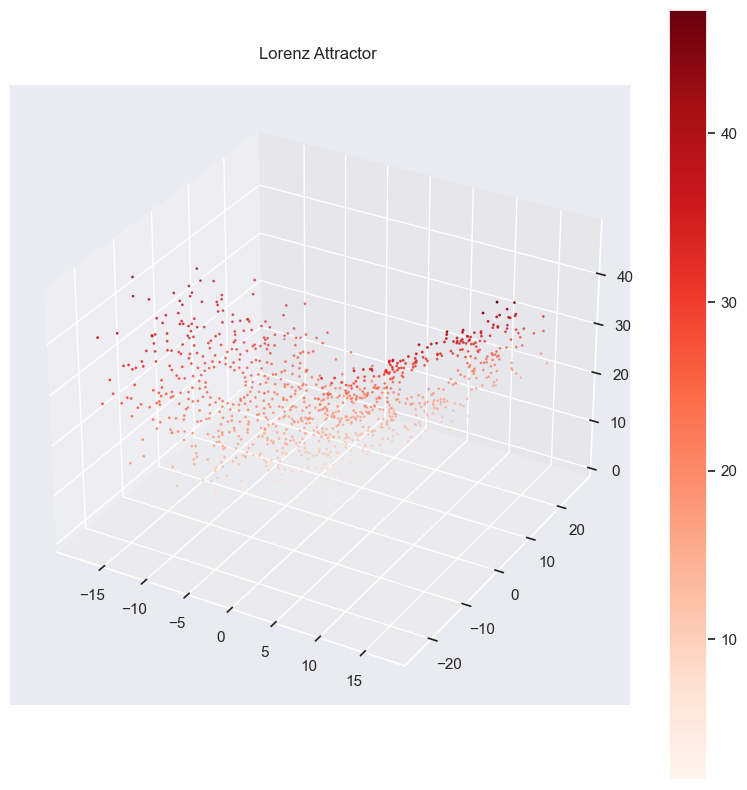

In [163]:
visualize_3d(real=data)

In [164]:
wandb_config = {
    'hidden_size': 256,
    'learning_rate': 1e-2,
    'batch_size': 50,
    'max_iterations': 1000,
}

# Initialize wandb configuration
wandb.config.update(wandb_config)

In [165]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [166]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-3)

In [167]:
data = data.to(device)

In [168]:
t = t.to(device)

In [169]:
data[0]

tensor([-8.,  7., 27.], device='cuda:0')

In [170]:
best_loss = 400.
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(model.state_dict(), 'saved_models/domain_best.pth')
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 800:
            optimizer.param_groups[0]['lr'] = 1e-4
        with torch.no_grad():
            pred_y = odeint(func, data[:10,0], t)
            pred_y = pred_y.permute(1, 0, 2)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [171]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-3)

In [172]:
best_loss = 400.
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(func.state_dict(), 'saved_models/domain_best.pth')
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 800:
            optimizer.param_groups[0]['lr'] = 1e-4
        with torch.no_grad():
            pred_y = odeint(func, data[:10,0], t)
            pred_y = pred_y.permute(1, 0, 2)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

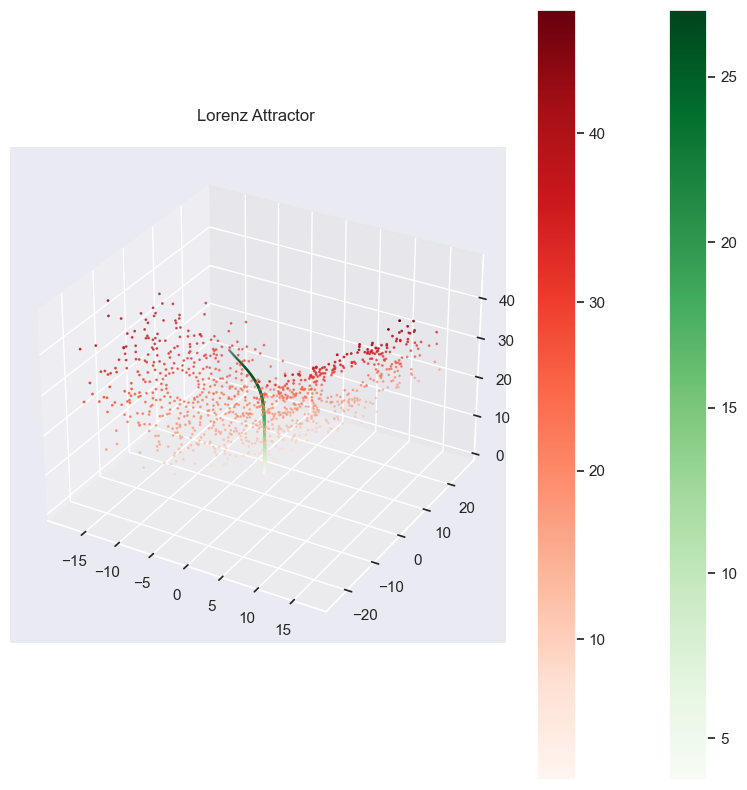

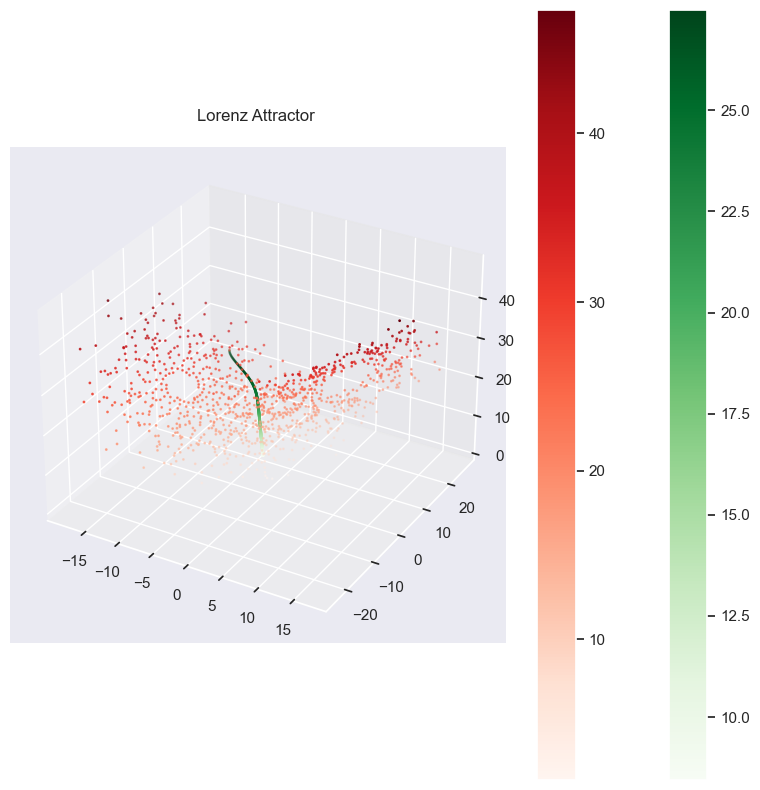

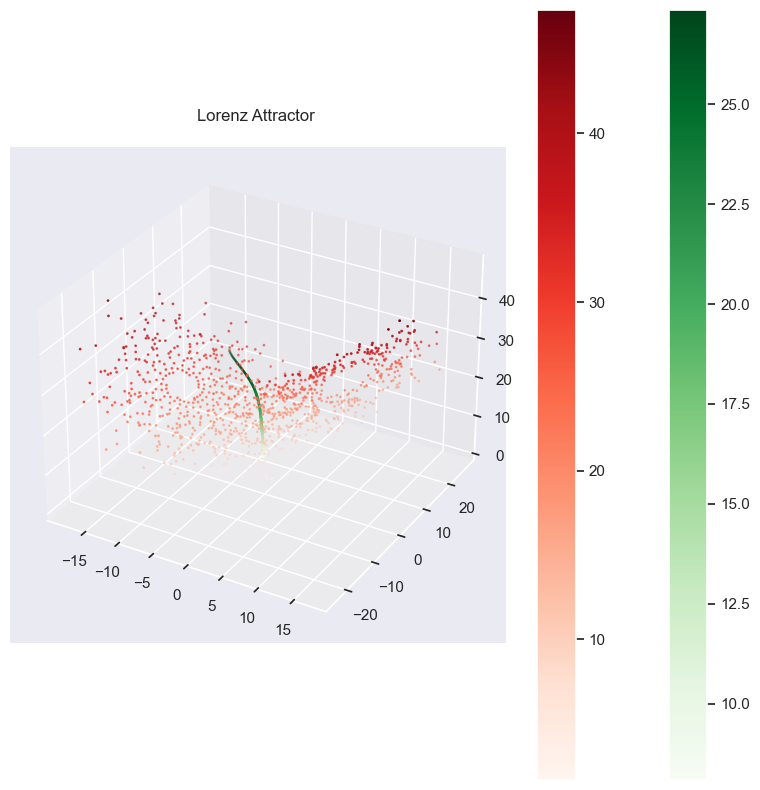

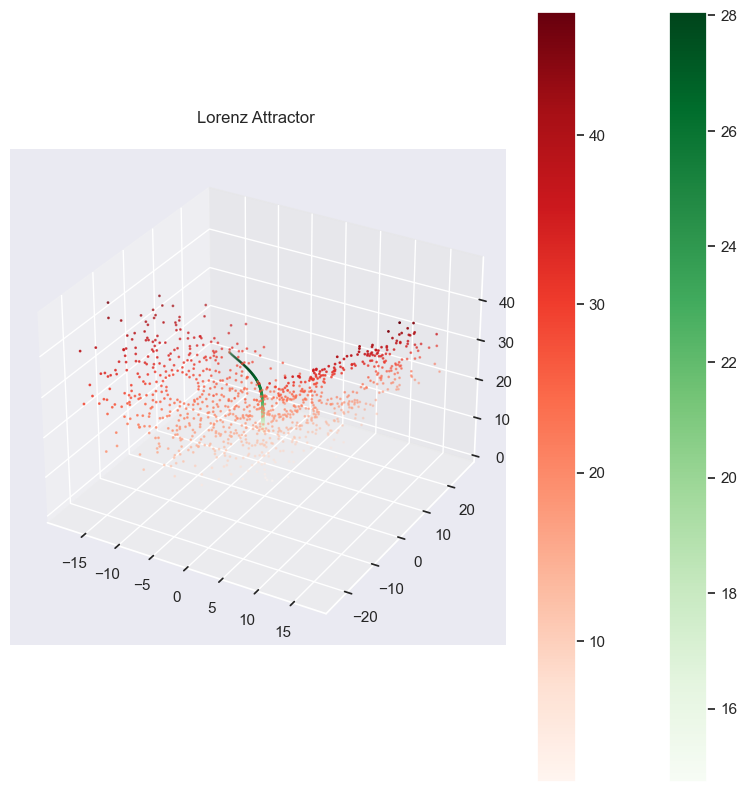

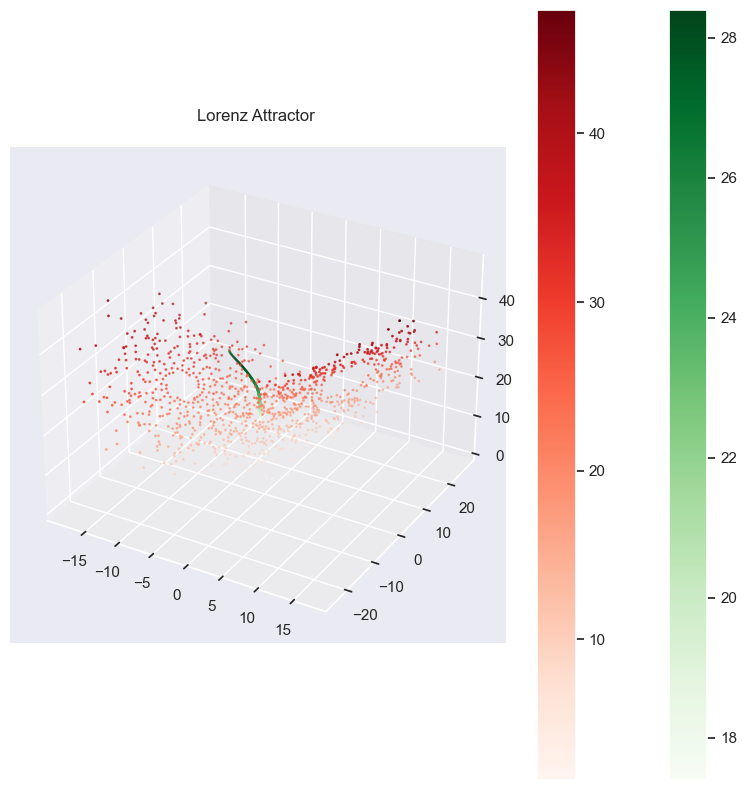

...

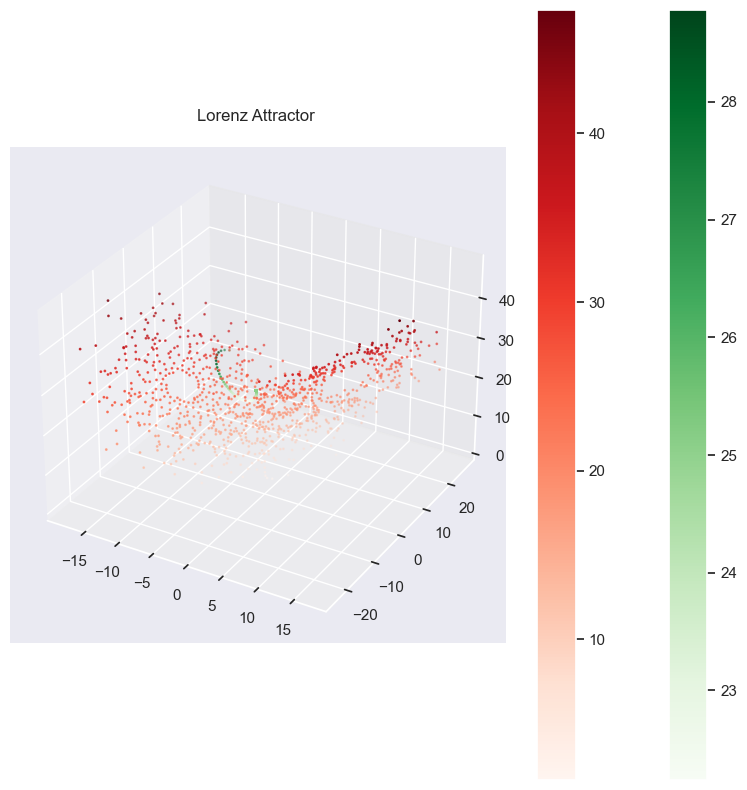

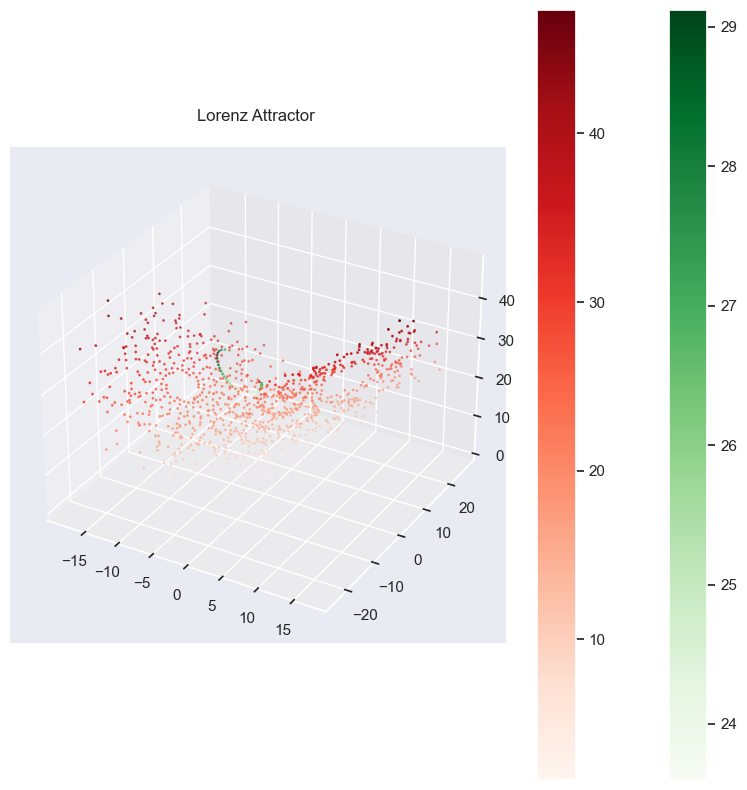

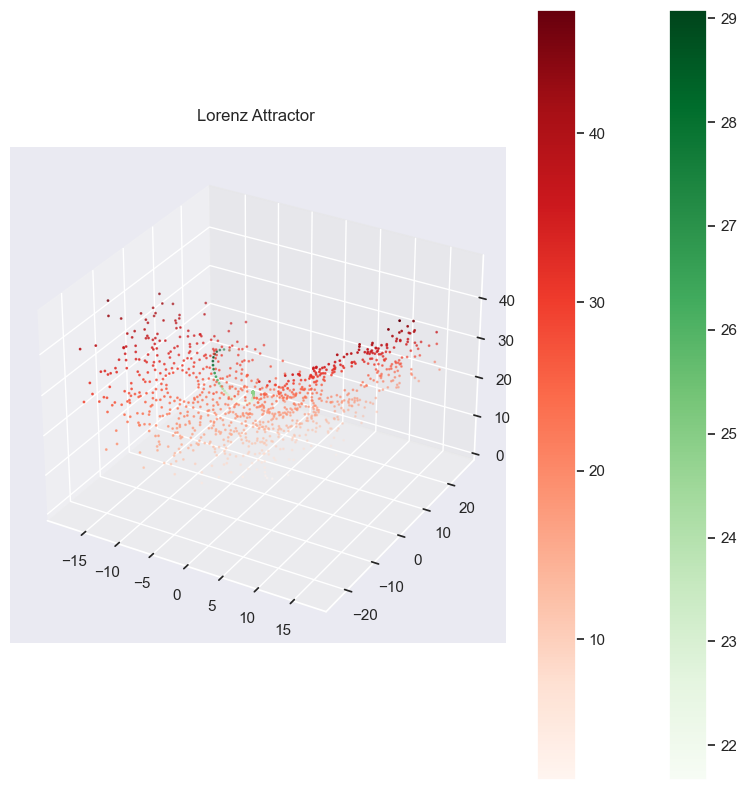

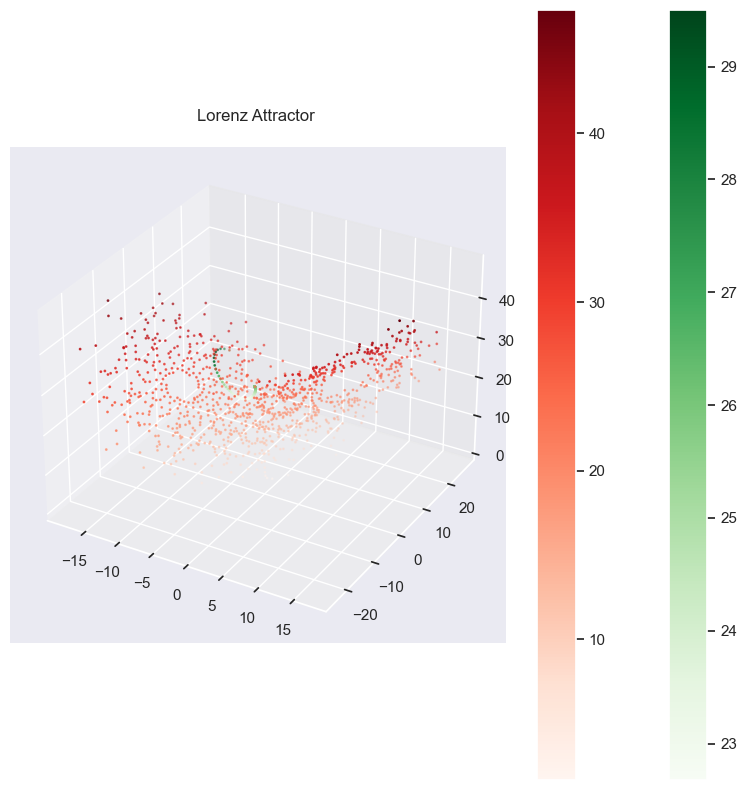

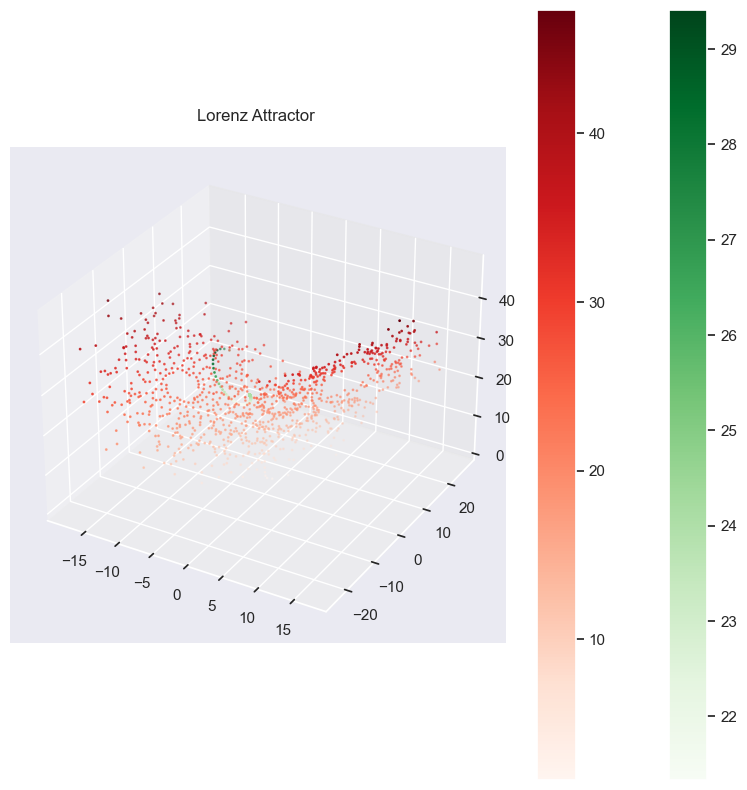

In [173]:
best_loss = 400.
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(func.state_dict(), 'saved_models/domain_best.pth')
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 800:
            optimizer.param_groups[0]['lr'] = 1e-4
        with torch.no_grad():
            pred_y = odeint(func, data[0], t)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

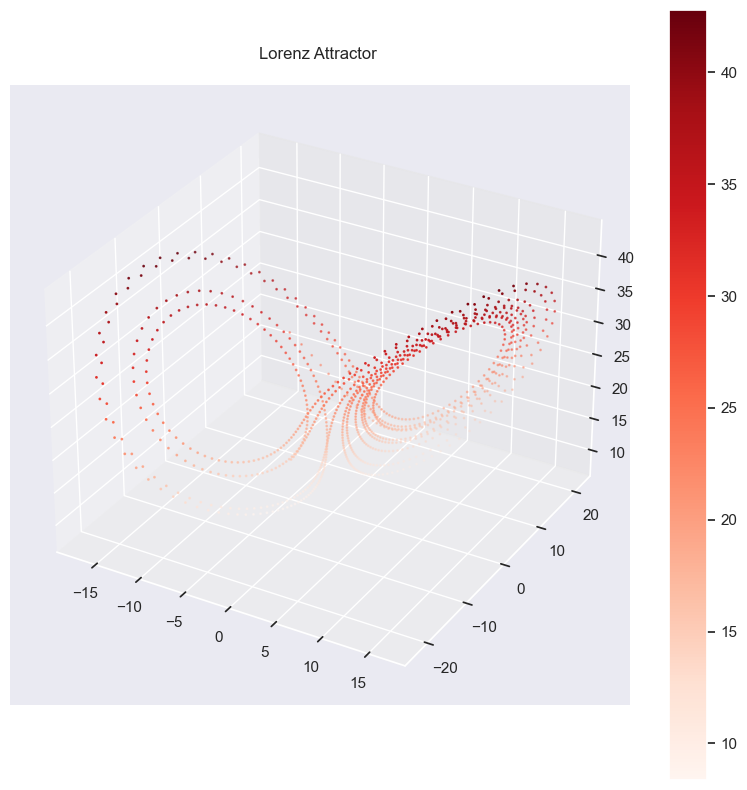

In [174]:
class Lorenz(nn.Module):
    """
    chaotic lorenz system
    """
    def __init__(self):
        super(Lorenz, self).__init__()
        self.lin = nn.Linear(5, 3, bias=False)
        W = torch.tensor([[-10., 10., 0., 0., 0.],
                          [28., -1., 0., -1., 0.],
                          [0., 0., -8. / 3., 0., 1.]])
        self.lin.weight = nn.Parameter(W)

    def forward(self, t, x):
        y = y = torch.ones([1, 5])
        y[0][0] = x[0][0]
        y[0][1] = x[0][1]
        y[0][2] = x[0][2]
        y[0][3] = x[0][0] * x[0][2]
        y[0][4] = x[0][0] * x[0][1]
        return self.lin(y)

true_y0 = torch.tensor([[-8., 7., 27.]])  # initial condition
t = torch.linspace(0., 10., 1000)  # t is from 0 to 25 for 1000 data points

# generating training data
with torch.no_grad():
    true_lorenz = odeint(Lorenz(), true_y0, t)

visualize_3d(real=true_lorenz)

In [175]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([-8., 7., 27.])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
data = odeint(Lorenz, x_0, t)

In [176]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([-8., 7., 27.])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
data = odeint(lorenz(), x_0, t)

In [177]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([-8., 7., 27.])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values

lorenz = lorenz()
# Using ODE Solver to Integrate the function to get the data
data = odeint(lorenz, x_0, t)

In [178]:
def lorenz(t, X):
    sigma = 10.
    beta = 8/3
    rho = 28.
    if X.ndim == 1:
        x, y, z = X
    else:
        x, y, z = X.unbind(dim=-1)
    xdot = sigma * (y - x)
    ydot = x * (rho - z) - y
    zdot = x * y - beta * z
    return torch.stack([xdot, ydot, zdot], dim=-1)

In [179]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([-8., 7., 27.])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values

lorenz = lorenz()
# Using ODE Solver to Integrate the function to get the data
data = odeint(lorenz, x_0, t)

In [180]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([-8., 7., 27.])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values

lorenz_ = lorenz()
# Using ODE Solver to Integrate the function to get the data
data = odeint(lorenz_, x_0, t)

In [181]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([-8., 7., 27.])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
data = odeint(Lorenz(), x_0, t)

In [182]:
num_conditions = 3
t = torch.linspace(0., 100., 1000)
x_0 = torch.tensor([[-8., 7., 27.]])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
data = odeint(Lorenz(), x_0, t)

In [183]:
data.shape

torch.Size([1000, 1, 3])

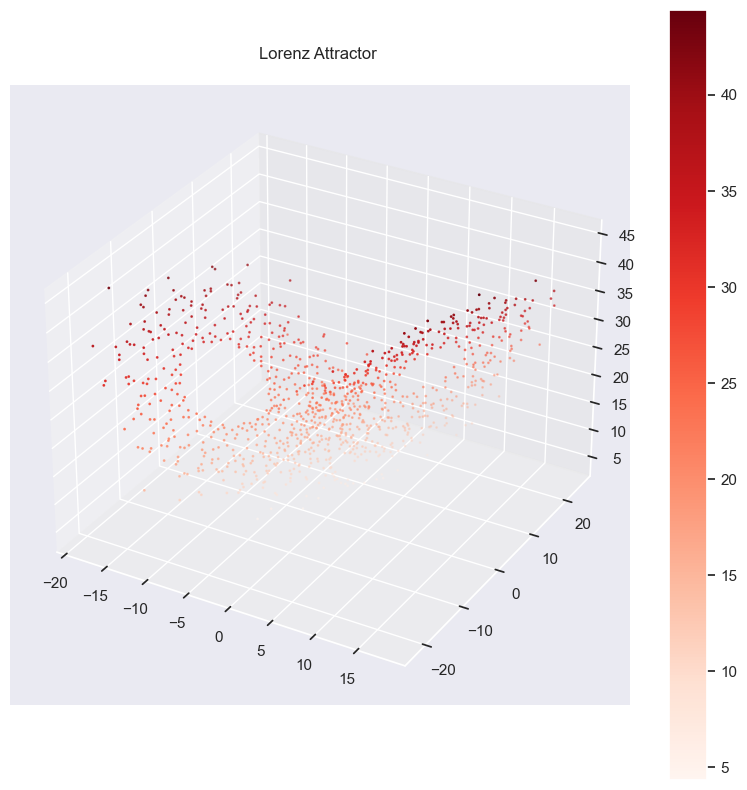

In [184]:
visualize_3d(real=data)

In [185]:
class LorenzTrain(nn.Module):
    """
    neural network for learning the chaotic lorenz system
    """
    def __init__(self):
        super(LorenzTrain, self).__init__()
        self.lin = nn.Linear(3, 256)
        self.lin3 = nn.Linear(256, 3)
        self.relu = nn.ReLU()

    def forward(self, t, x):
        x = self.relu(self.lin(x))
        x = self.lin3(x)
        return x
     

In [186]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [187]:
np.random.seed(7)

In [188]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-3)

In [189]:
data = data.to(device)

In [190]:
t = t.to(device)

In [191]:
data[0]

tensor([[-8.,  7., 27.]], device='cuda:0', grad_fn=<SelectBackward0>)

In [192]:
best_loss = 400.
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(func.state_dict(), 'saved_models/domain_best.pth')
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 800:
            optimizer.param_groups[0]['lr'] = 1e-4
        with torch.no_grad():
            pred_y = odeint(func, data[0], t)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [193]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-3)

In [194]:
best_loss = 400.
for itr in range(1, wandb.config.max_iterations + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data, wandb.config.batch_size)

    pred_y = odeint(func, batch_y0, batch_t)
    loss = F.mse_loss(pred_y, batch_y)
    if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(func.state_dict(), 'saved_models/domain_best.pth')
    loss.backward()
    optimizer.step()

    if itr % 40 == 0:
        if itr > 800:
            optimizer.param_groups[0]['lr'] = 1e-4
        with torch.no_grad():
            pred_y = odeint(func, data[0], t)
            loss = F.mse_loss(pred_y, data)
            save_name = "PNG/" + str(itr)

            visualize_3d(real=data.cpu(), train=pred_y.cpu())

            # Log metrics to wandb
            wandb.log({'Iteration': itr, 'Loss': loss.item()})
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [195]:
num_conditions = 3
t = torch.linspace(0., 10., 1000)
x_0 = torch.tensor([[-8., 7., 27.]])
data = []

# Generate random initial conditions and integrate the Lorenz system
# for _ in range(num_conditions):
#     x_0 = torch.rand(3)  # Generate a random initial condition
#     result = odeint(lorenz, x_0, t)
#     data.append(result)

# Convert the list of data to a NumPy array
# data = torch.stack(data, dim=0)
# Define the time values


# Using ODE Solver to Integrate the function to get the data
data = odeint(Lorenz(), x_0, t)

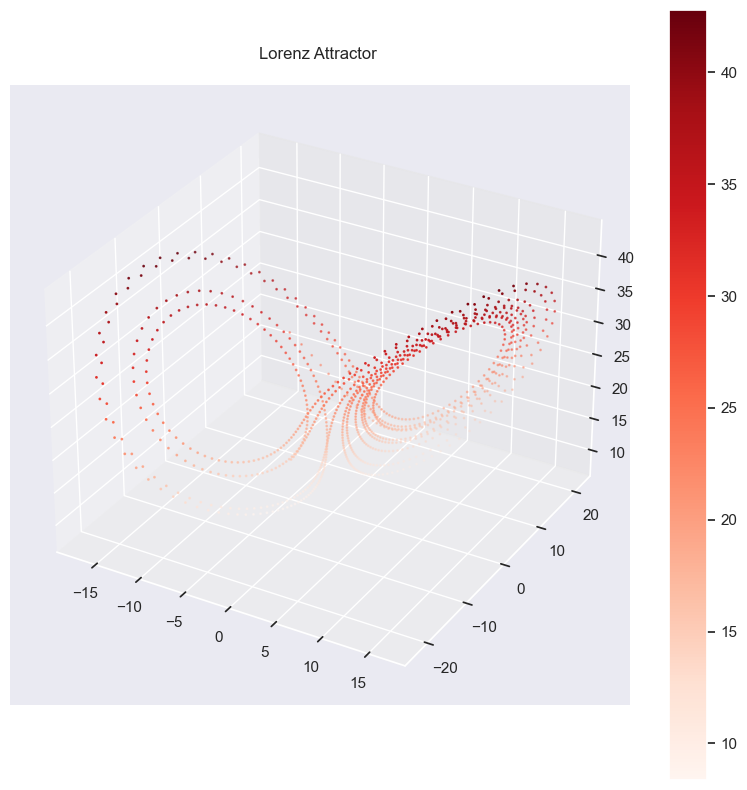

In [196]:
visualize_3d(real=data)

In [197]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [198]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-3)

In [199]:
data = data.to(device)

In [200]:
t = t.to(device)

In [201]:
data[0]

tensor([[-8.,  7., 27.]], device='cuda:0', grad_fn=<SelectBackward0>)

In [202]:

func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize_3d
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [203]:
for itr in range(1, 3000 + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(data,50)  # getting trajectory batch
    pred_y = odeint(func, batch_y0, batch_t)  # prediction using batch initial condition and batch time stamps
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()
    if itr % 40 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, data[0], t)
            loss = F.mse_loss(pred_y, data)
            
            visualize_3d(real=data, 
                             train=pred_y)

            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            clear_output(wait=True)

In [204]:
from torch.utils.data import DataLoader

In [205]:
import os
import wandb
import numpy as np
from IPython.display import clear_output
import seaborn as sns
from torchdiffeq import odeint
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import matplotlib.pyplot as plt

In [206]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
print("GPU Name:", torch.cuda.get_device_name(0))

In [207]:
wandb.login()

True

In [208]:
wandb.init(project="NODE_rnn", group="NODE_rnn",save_code=True,notes="Neural ODE RNN runs and evaluation")